In [277]:
!pip install pandas-extras
!pip install --upgrade typing_extensions
!pip install numpy==1.25.2 ydata-profiling


import pandas as pd
import unicodedata
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport



## Data Cleansing / Preprocessing

#### Orders

In [278]:
df_orders = pd.read_csv('olist_orders_dataset.csv')

In [279]:
df_orders.info()
df_orders.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,02/10/2017 10:56,02/10/2017 11:07,04/10/2017 19:55,10/10/2017 21:25,18/10/2017 00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,24/07/2018 20:41,26/07/2018 03:24,26/07/2018 14:31,07/08/2018 15:27,13/08/2018 00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,08/08/2018 08:38,08/08/2018 08:55,08/08/2018 13:50,17/08/2018 18:06,04/09/2018 00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,18/11/2017 19:28,18/11/2017 19:45,22/11/2017 13:39,02/12/2017 00:28,15/12/2017 00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,13/02/2018 21:18,13/02/2018 22:20,14/02/2018 19:46,16/02/2018 18:17,26/02/2018 00:00
5,a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,09/07/2017 21:57,09/07/2017 22:10,11/07/2017 14:58,26/07/2017 10:57,01/08/2017 00:00
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,11/04/2017 12:22,13/04/2017 13:25,NaN,NaN,09/05/2017 00:00
7,6514b8ad8028c9f2cc2374ded245783f,9bdf08b4b3b52b5526ff42d37d47f222,delivered,16/05/2017 13:10,16/05/2017 13:22,22/05/2017 10:07,26/05/2017 12:55,07/06/2017 00:00
8,76c6e866289321a7c93b82b54852dc33,f54a9f0e6b351c431402b8461ea51999,delivered,23/01/2017 18:29,25/01/2017 02:50,26/01/2017 14:16,02/02/2017 14:08,06/03/2017 00:00
9,e69bfb5eb88e0ed6a785585b27e16dbf,31ad1d1b63eb9962463f764d4e6e0c9d,delivered,29/07/2017 11:55,29/07/2017 12:05,10/08/2017 19:45,16/08/2017 17:14,23/08/2017 00:00


In [280]:
# Rename the name of the columns
df_orders.rename(columns={
    'order_purchase_timestamp': 'order_purchase',
    'order_approved_at': 'order_approved',
    'order_delivered_carrier_date': 'order_delivered_carrier',
    'order_delivered_customer_date': 'order_delivered_customer',
    'order_estimated_delivery_date': 'order_estimated_delivery',
}, inplace=True)


In [281]:
df_orders.head()

,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,02/10/2017 10:56,02/10/2017 11:07,04/10/2017 19:55,10/10/2017 21:25,18/10/2017 00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,24/07/2018 20:41,26/07/2018 03:24,26/07/2018 14:31,07/08/2018 15:27,13/08/2018 00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,08/08/2018 08:38,08/08/2018 08:55,08/08/2018 13:50,17/08/2018 18:06,04/09/2018 00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,18/11/2017 19:28,18/11/2017 19:45,22/11/2017 13:39,02/12/2017 00:28,15/12/2017 00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,13/02/2018 21:18,13/02/2018 22:20,14/02/2018 19:46,16/02/2018 18:17,26/02/2018 00:00


In [282]:
# Convert order_status to a categorical variable
df_orders['order_status'] = df_orders['order_status'].astype('category')

# Convert time variables to a datetime variable
timestamp_cols = [
    'order_purchase',
    'order_approved',
    'order_delivered_carrier',
    'order_delivered_customer',
    'order_estimated_delivery'
]

# Convert to datetime with specified format
df_orders[timestamp_cols] = df_orders[timestamp_cols].apply(
    lambda col: pd.to_datetime(col, format='%d/%m/%Y %H:%M', errors='coerce')
)

In [283]:
# Normalize order status strings

df_orders['order_status'] = (
    df_orders['order_status']
    .str.lower()                         # lowercase
    .str.strip()                         # trim whitespace
    .apply(lambda x: unicodedata.normalize("NFKD", x))  # normalise accents
)

In [284]:
df_orders.info()
df_orders.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_id                  99441 non-null  object        
 1   customer_id               99441 non-null  object        
 2   order_status              99441 non-null  object        
 3   order_purchase            99441 non-null  datetime64[ns]
 4   order_approved            99281 non-null  datetime64[ns]
 5   order_delivered_carrier   97658 non-null  datetime64[ns]
 6   order_delivered_customer  96476 non-null  datetime64[ns]
 7   order_estimated_delivery  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:00,2018-07-26 03:24:00,2018-07-26 14:31:00,2018-08-07 15:27:00,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:00,2018-08-08 08:55:00,2018-08-08 13:50:00,2018-08-17 18:06:00,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:00,2017-11-18 19:45:00,2017-11-22 13:39:00,2017-12-02 00:28:00,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:00,2018-02-13 22:20:00,2018-02-14 19:46:00,2018-02-16 18:17:00,2018-02-26


#### Customers

In [285]:
df_customers = pd.read_csv('olist_customers_dataset.csv')
df_customers.head(10)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
5,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC
6,fd826e7cf63160e536e0908c76c3f441,addec96d2e059c80c30fe6871d30d177,4534,sao paulo,SP
7,5e274e7a0c3809e14aba7ad5aae0d407,57b2a98a409812fe9618067b6b8ebe4f,35182,timoteo,MG
8,5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR
9,4b7139f34592b3a31687243a302fa75b,9afe194fb833f79e300e37e580171f22,30575,belo horizonte,MG


In [286]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [287]:
# Convert customer_city and customer_state to a categorical variable
df_customers['customer_city'] = df_customers['customer_city'].astype('category')
df_customers['customer_state'] = df_customers['customer_state'].astype('category')
df_customers['customer_zip_code_prefix'] = df_customers['customer_zip_code_prefix'].astype('category')

In [288]:
# City column → lowercase, strip, remove accents
df_customers['customer_city'] = (
    df_customers['customer_city']
    .str.lower()
    .str.strip()
    .apply(lambda val: unicodedata.normalize("NFKD", val))
)

# State column → uppercase, strip, remove accents
df_customers['customer_state'] = (
    df_customers['customer_state']
    .str.upper()
    .str.strip()
    .apply(lambda val: unicodedata.normalize("NFKD", val))
)

# Zip code → ensure string, strip, remove accents, cast to category
df_customers['customer_zip_code_prefix'] = (
    df_customers['customer_zip_code_prefix']
    .astype(str)
    .str.strip()
    .apply(lambda val: unicodedata.normalize("NFKD", val))
    .astype('category')
)


In [289]:
df_customers['customer_city'] = df_customers['customer_city'].astype('category')
df_customers['customer_state'] = df_customers['customer_state'].astype('category')

In [290]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   customer_id               99441 non-null  object  
 1   customer_unique_id        99441 non-null  object  
 2   customer_zip_code_prefix  99441 non-null  category
 3   customer_city             99441 non-null  category
 4   customer_state            99441 non-null  category
dtypes: category(3), object(2)
memory usage: 2.8+ MB


#### Items

In [291]:
df_items = pd.read_csv('olist_order_items_dataset.csv')
df_items.info()
df_items.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [292]:
# Convert shipping_limit_date to datetime
df_items['shipping_limit_date'] = pd.to_datetime(
    df_items['shipping_limit_date'],
    format='%Y-%m-%d %H:%M:%S',
    errors='coerce'
)

In [293]:
df_items.info()
df_items.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


#### Payment

In [294]:
df_payment = pd.read_csv('olist_order_payments_dataset.csv')
df_payment.info()
df_payment.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [295]:
df_payment['payment_installments'] = df_payment['payment_installments'].astype('category')


In [296]:
df_payment['payment_type'].value_counts()


payment_type
credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: count, dtype: int64

#### Product

In [297]:
df_product = pd.read_csv('olist_products_dataset.csv')
df_product_category_translation = pd.read_csv('product_category_name_translation.csv')
df_product.info()
df_product.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [298]:
df_product_category_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [299]:
translation_dict = df_product_category_translation.set_index('product_category_name')['product_category_name_english'].to_dict()
df_product['product_category_name_english'] = df_product['product_category_name'].map(translation_dict)


In [300]:
df_product.head(10)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
5,41d3672d4792049fa1779bb35283ed13,instrumentos_musicais,60.0,745.0,1.0,200.0,38.0,5.0,11.0,musical_instruments
6,732bd381ad09e530fe0a5f457d81becb,cool_stuff,56.0,1272.0,4.0,18350.0,70.0,24.0,44.0,cool_stuff
7,2548af3e6e77a690cf3eb6368e9ab61e,moveis_decoracao,56.0,184.0,2.0,900.0,40.0,8.0,40.0,furniture_decor
8,37cc742be07708b53a98702e77a21a02,eletrodomesticos,57.0,163.0,1.0,400.0,27.0,13.0,17.0,home_appliances
9,8c92109888e8cdf9d66dc7e463025574,brinquedos,36.0,1156.0,1.0,600.0,17.0,10.0,12.0,toys


In [301]:
df_product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   product_id                     32951 non-null  object 
 1   product_category_name          32341 non-null  object 
 2   product_name_lenght            32341 non-null  float64
 3   product_description_lenght     32341 non-null  float64
 4   product_photos_qty             32341 non-null  float64
 5   product_weight_g               32949 non-null  float64
 6   product_length_cm              32949 non-null  float64
 7   product_height_cm              32949 non-null  float64
 8   product_width_cm               32949 non-null  float64
 9   product_category_name_english  32328 non-null  object 
dtypes: float64(7), object(3)
memory usage: 2.5+ MB


In [302]:
df_product = df_product.drop(columns=['product_category_name'])
df_product.head()


,product_id,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares


In [303]:
df_product['product_category_name_english'] = df_product['product_category_name_english'].astype('category')
df_product.rename(columns={'product_category_name_english': 'product_category'}, inplace=True)

#### Sellers

In [304]:
df_sellers = pd.read_csv('olist_sellers_dataset.csv')
df_sellers.info()
df_sellers.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [305]:
# Normalize all string columns: lowercase and strip whitespace
df_sellers['seller_city'] = df_sellers[['seller_city']].apply(lambda x: x.str.lower().str.strip())
df_sellers['seller_state'] = df_sellers[['seller_state']].apply(lambda x: x.str.upper().str.strip())

# Convert it into category data type
df_sellers['seller_city'] = df_sellers['seller_city'].astype('category')
df_sellers['seller_state'] = df_sellers['seller_state'].astype('category')

In [306]:
df_sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   seller_id               3095 non-null   object  
 1   seller_zip_code_prefix  3095 non-null   int64   
 2   seller_city             3095 non-null   category
 3   seller_state            3095 non-null   category
dtypes: category(2), int64(1), object(1)
memory usage: 79.2+ KB


## Data Understanding & Exploration

#### Order

In [307]:
df_orders_profile = ProfileReport(df_orders, title = "Orders", explorative=True)
df_orders_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [308]:
missing_approved = df_orders[
    df_orders['order_approved'].isna()
]
missing_approved.head()

,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:00,NaT,NaT,NaT,2018-09-12
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:00,NaT,NaT,NaT,2018-10-17
1868,df8282afe61008dc26c6c31011474d02,aa797b187b5466bc6925aaaa4bb3bed1,canceled,2017-03-04 12:14:00,NaT,NaT,NaT,2017-04-10
2029,8d4c637f1accf7a88a4555f02741e606,b1dd715db389a2077f43174e7a675d07,canceled,2018-08-29 16:27:00,NaT,NaT,NaT,2018-09-13
2161,7a9d4c7f9b068337875b95465330f2fc,7f71ae48074c0cfec9195f88fcbfac55,canceled,2017-05-01 16:12:00,NaT,NaT,NaT,2017-05-30


In [309]:
missing_approved = df_orders[
    df_orders['order_approved'].isna() & (df_orders['order_status'] == 'delivered')
]
missing_approved.head(50)


,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery
5323,e04abd8149ef81b95221e88f6ed9ab6a,2127dc6603ac33544953ef05ec155771,delivered,2017-02-18 14:40:00,NaT,2017-02-23 12:04:00,2017-03-01 13:25:00,2017-03-17
16567,8a9adc69528e1001fc68dd0aaebbb54a,4c1ccc74e00993733742a3c786dc3c1f,delivered,2017-02-18 12:45:00,NaT,2017-02-23 09:01:00,2017-03-02 10:05:00,2017-03-21
19031,7013bcfc1c97fe719a7b5e05e61c12db,2941af76d38100e0f8740a374f1a5dc3,delivered,2017-02-18 13:29:00,NaT,2017-02-22 16:25:00,2017-03-01 08:07:00,2017-03-17
22663,5cf925b116421afa85ee25e99b4c34fb,29c35fc91fc13fb5073c8f30505d860d,delivered,2017-02-18 16:48:00,NaT,2017-02-22 11:23:00,2017-03-09 07:28:00,2017-03-31
23156,12a95a3c06dbaec84bcfb0e2da5d228a,1e101e0daffaddce8159d25a8e53f2b2,delivered,2017-02-17 13:05:00,NaT,2017-02-22 11:23:00,2017-03-02 11:09:00,2017-03-20
26800,c1d4211b3dae76144deccd6c74144a88,684cb238dc5b5d6366244e0e0776b450,delivered,2017-01-19 12:48:00,NaT,2017-01-25 14:56:00,2017-01-30 18:16:00,2017-03-01
38290,d69e5d356402adc8cf17e08b5033acfb,68d081753ad4fe22fc4d410a9eb1ca01,delivered,2017-02-19 01:28:00,NaT,2017-02-23 03:11:00,2017-03-02 03:41:00,2017-03-27
39334,d77031d6a3c8a52f019764e68f211c69,0bf35cac6cc7327065da879e2d90fae8,delivered,2017-02-18 11:04:00,NaT,2017-02-23 07:23:00,2017-03-02 16:15:00,2017-03-22
48401,7002a78c79c519ac54022d4f8a65e6e8,d5de688c321096d15508faae67a27051,delivered,2017-01-19 22:26:00,NaT,2017-01-27 11:08:00,2017-02-06 14:22:00,2017-03-16
61743,2eecb0d85f281280f79fa00f9cec1a95,a3d3c38e58b9d2dfb9207cab690b6310,delivered,2017-02-17 17:21:00,NaT,2017-02-22 11:42:00,2017-03-03 12:16:00,2017-03-20


In [310]:
df_orders['order_approved'].isna().value_counts()


order_approved
False    99281
True       160
Name: count, dtype: int64

##### Summary
- order_purchase,  there is a gap in 2016 in all columns. 
- order_approved, 160 rows missing.
- order_delivered_carrier, 1783 rows missing.
- order_delivered_customer, 2965 rows missing


#### Customers

In [311]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   customer_id               99441 non-null  object  
 1   customer_unique_id        99441 non-null  object  
 2   customer_zip_code_prefix  99441 non-null  category
 3   customer_city             99441 non-null  category
 4   customer_state            99441 non-null  category
dtypes: category(3), object(2)
memory usage: 2.8+ MB


In [312]:
df_customers.describe(include='all')

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441,99441,99441
unique,99441,96096,14994,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,22790,sao paulo,SP
freq,1,17,142,15540,41746


In [313]:
df_customers.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [314]:
df_customers.duplicated().sum()

0

In [315]:
df_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


##### Summary
- customer_unique_id, 3% is duplicated. Acceptable since some customers order multiple orders. Only customer_id need to be unique

#### Items

In [316]:
df_items.describe(include='all')

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
count,112650,112650.000000,112650,112650,112650,112650.000000,112650.000000
unique,98666,NaN,32951,3095,NaN,NaN,NaN
top,8272b63d03f5f79c56e9e4120aec44ef,NaN,aca2eb7d00ea1a7b8ebd4e68314663af,6560211a19b47992c3666cc44a7e94c0,NaN,NaN,NaN
freq,21,NaN,527,2033,NaN,NaN,NaN
mean,NaN,1.197834,NaN,NaN,2018-01-07 15:36:52.192685312,120.653739,19.990320
min,NaN,1.000000,NaN,NaN,2016-09-19 00:15:34,0.850000,0.000000
25%,NaN,1.000000,NaN,NaN,2017-09-20 20:57:27.500000,39.900000,13.080000
50%,NaN,1.000000,NaN,NaN,2018-01-26 13:59:35,74.990000,16.260000
75%,NaN,1.000000,NaN,NaN,2018-05-10 14:34:00.750000128,134.900000,21.150000
max,NaN,21.000000,NaN,NaN,2020-04-09 22:35:08,6735.000000,409.680000


In [317]:
df_items_profile = ProfileReport(df_items, title = "Items", explorative=True)
df_items_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [318]:
df_items.groupby('product_id')['seller_id'].nunique().value_counts().to_frame('products_count')

,products_count
seller_id,
1,31726
2,1030
3,147
4,32
5,10
7,3
8,2
6,1


In [319]:
# how many zero values in freight value column
(df_items['freight_value'] == 0).mean() * 100


0.33999112294718153

In [320]:
%matplotlib inline


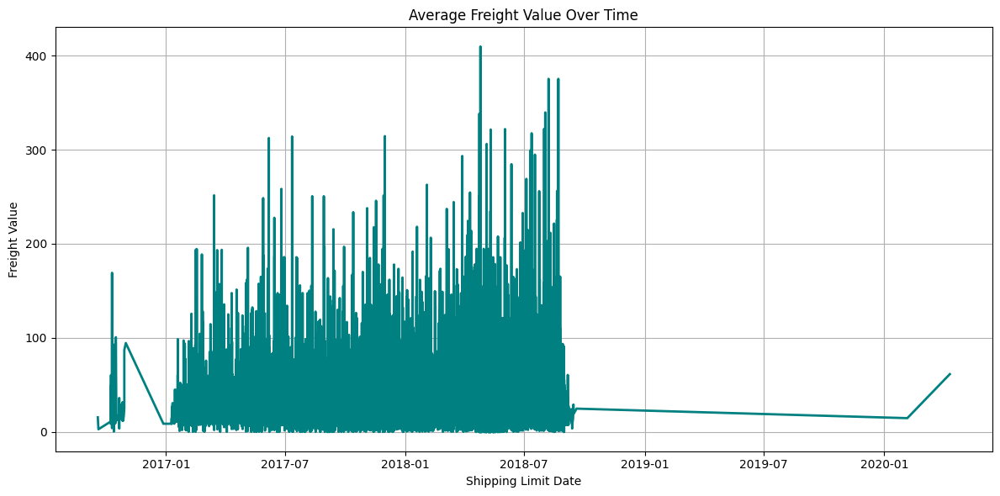

In [321]:
# Ensure shipping_limit_date is in datetime format
shipping_limit_date = pd.to_datetime(df_items['shipping_limit_date'])


# Sort values by date for proper line flow
sorted_indices = shipping_limit_date.argsort()
shipping_limit_date = shipping_limit_date[sorted_indices]
freight_values = df_items['freight_value'].values[sorted_indices]

plt.figure(figsize=(12, 6))
plt.plot(shipping_limit_date, freight_values, color='teal', linewidth=2)
plt.title('Average Freight Value Over Time')
plt.xlabel('Shipping Limit Date')
plt.ylabel('Freight Value')
plt.grid(True)
plt.tight_layout()
plt.show()


In [322]:
filtered_df_items = df_items[
    (df_items['shipping_limit_date'] >= '2017-01-01') &
    (df_items['shipping_limit_date'] <= '2017-07-31')
][['shipping_limit_date', 'freight_value']]

In [323]:
filtered_df_items = filtered_df_items.sort_values(by='shipping_limit_date', ascending=True)


In [324]:
filtered_df_items.head()

,shipping_limit_date,freight_value
104115,2017-01-09 11:56:06,8.72
81567,2017-01-09 12:01:20,8.72
24916,2017-01-09 12:06:36,8.72
53673,2017-01-09 12:09:08,8.72
46997,2017-01-09 12:11:23,8.72


In [325]:
avg_price = df_items['price'].mean()
print(avg_price)

120.65373901464716


In [326]:
avg_price = df_items['freight_value'].mean()
print(avg_price)

19.990319928983578


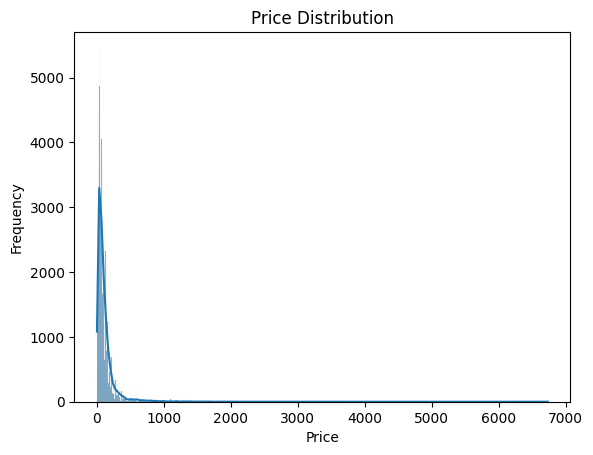

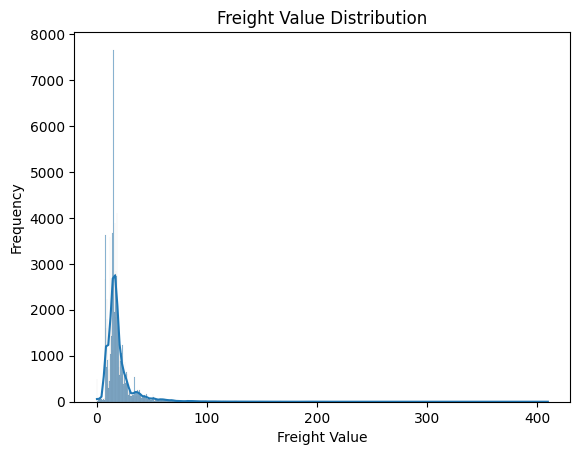

In [327]:
sns.histplot(df_items['price'],kde=True)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

sns.histplot(df_items['freight_value'], kde=True)
plt.title('Freight Value Distribution')
plt.xlabel('Freight Value')
plt.ylabel('Frequency')
plt.show()


##### Summary
- The maximum items in one single order is 21.
- **freight_value** there are zero values. 
- products 1225(3.72%) has been sold by more than 1 sellers. 

#### Payment


In [328]:
df_payment.describe(include='all')

,order_id,payment_sequential,payment_type,payment_installments,payment_value
count,103886,103886.000000,103886,103886.0,103886.000000
unique,99440,NaN,5,24.0,NaN
top,fa65dad1b0e818e3ccc5cb0e39231352,NaN,credit_card,1.0,NaN
freq,29,NaN,76795,52546.0,NaN
mean,NaN,1.092679,NaN,NaN,154.100380
std,NaN,0.706584,NaN,NaN,217.494064
min,NaN,1.000000,NaN,NaN,0.000000
25%,NaN,1.000000,NaN,NaN,56.790000
50%,NaN,1.000000,NaN,NaN,100.000000
75%,NaN,1.000000,NaN,NaN,171.837500


In [329]:
df_payment_profile = ProfileReport(df_payment, title = "Payment", explorative=True)
df_payment_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [330]:
# Zero in payment_value and payment_installments
combined_filter = df_payment[
    (df_payment['payment_value'] == 0) |  # OR
    (df_payment['payment_installments'] == 0)
]
combined_filter.head(20)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.00
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.00
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.00
46982,744bade1fcf9ff3f31d860ace076d422,2,credit_card,0,58.69
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.00
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.00
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.00
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.00
79014,1a57108394169c0b47d8f876acc9ba2d,2,credit_card,0,129.94
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.00


In [331]:
zero_paymentinstallments = df_items[
    (df_items['order_id'] == '744bade1fcf9ff3f31d860ace076d422') |
    (df_items['order_id'] == '1a57108394169c0b47d8f876acc9ba2d')
]
zero_paymentinstallments.head()


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
11589,1a57108394169c0b47d8f876acc9ba2d,1,db35a562fb6ba63e19fa42a15349dc04,282f23a9769b2690c5dda22e316f9941,2018-05-18 16:31:54,41.69,23.28
11590,1a57108394169c0b47d8f876acc9ba2d,2,db35a562fb6ba63e19fa42a15349dc04,282f23a9769b2690c5dda22e316f9941,2018-05-18 16:31:54,41.69,23.28
51167,744bade1fcf9ff3f31d860ace076d422,1,0cf573090c66bb30ac5e53c82bdb0403,7202e2ba20579a9bd1acb29e61fe71f6,2018-04-26 12:31:06,45.90,12.79


##### payment value zero are either "voucher" or "not_defined".

##### Summary
- **payment type** credit card (74%) and bolete (19%)
- **installment** 1(50%), 2(12%), 3(10%)
- **payment value** there are 9 zero-value payment and 1 (13664) payment. Median is 100.

#### Sellers

In [332]:
df_sellers_profile = ProfileReport(df_sellers, title = "Sellers", explorative=True)
df_sellers_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### Summmary 
- 60% of the sellers are in SP state.
- 22% of the sellers are in Sao Paulo city.

#### Product


In [333]:
df_product_profile = ProfileReport(df_product, title = "Products", explorative=True)
df_product_profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### Summary
- product length & product photos > 610 (2%) are missing
- product weight, height, length, width > 2 rows are missing

## Data Preprocessing

### Data Merging

In [334]:
# Group by temporary Year-Month without adding a new column
monthly_counts = (
    df_orders
    .groupby(df_orders['order_approved'].dt.to_period('M'))
    .size()
    .reset_index(name='order_count')
)

# Optional: convert Period to string for display
monthly_counts['order_approved'] = monthly_counts['order_approved'].astype(str)

print(monthly_counts)


   order_approved  order_count
0         2016-09            1
1         2016-10          320
2         2016-12            1
3         2017-01          760
4         2017-02         1765
5         2017-03         2689
6         2017-04         2374
7         2017-05         3693
8         2017-06         3252
9         2017-07         3974
10        2017-08         4348
11        2017-09         4301
12        2017-10         4590
13        2017-11         7395
14        2017-12         5832
15        2018-01         7187
16        2018-02         6706
17        2018-03         7288
18        2018-04         6778
19        2018-05         7066
20        2018-06         6164
21        2018-07         6176
22        2018-08         6620
23        2018-09            1


there are very few rows before Jan 2017 and only 1 row after August 2018. I will trim those data for more accurate analysis.

In [335]:
df_orders = df_orders[
    (df_orders['order_approved'] >= '2017-01-01') &
    (df_orders['order_approved'] <= '2018-08-31')
]

In [336]:
# Group by temporary Year-Month without adding a new column
monthly_counts = (
    df_orders
    .groupby(df_orders['order_approved'].dt.to_period('M'))
    .size()
    .reset_index(name='order_count')
)

# Optional: convert Period to string for display
monthly_counts['order_approved'] = monthly_counts['order_approved'].astype(str)

print(monthly_counts)

   order_approved  order_count
0         2017-01          760
1         2017-02         1765
2         2017-03         2689
3         2017-04         2374
4         2017-05         3693
5         2017-06         3252
6         2017-07         3974
7         2017-08         4348
8         2017-09         4301
9         2017-10         4590
10        2017-11         7395
11        2017-12         5832
12        2018-01         7187
13        2018-02         6706
14        2018-03         7288
15        2018-04         6778
16        2018-05         7066
17        2018-06         6164
18        2018-07         6176
19        2018-08         6620


In [337]:
df_orders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98958 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_id                  98958 non-null  object        
 1   customer_id               98958 non-null  object        
 2   order_status              98958 non-null  object        
 3   order_purchase            98958 non-null  datetime64[ns]
 4   order_approved            98958 non-null  datetime64[ns]
 5   order_delivered_carrier   97362 non-null  datetime64[ns]
 6   order_delivered_customer  96190 non-null  datetime64[ns]
 7   order_estimated_delivery  98958 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.8+ MB


In [338]:
# merge df_orders table and df_customers on customer_id

df_merged = pd.merge(df_orders, df_customers, on='customer_id', how='inner')   # inner to keep only matching orders


In [339]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98958 entries, 0 to 98957
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_id                  98958 non-null  object        
 1   customer_id               98958 non-null  object        
 2   order_status              98958 non-null  object        
 3   order_purchase            98958 non-null  datetime64[ns]
 4   order_approved            98958 non-null  datetime64[ns]
 5   order_delivered_carrier   97362 non-null  datetime64[ns]
 6   order_delivered_customer  96190 non-null  datetime64[ns]
 7   order_estimated_delivery  98958 non-null  datetime64[ns]
 8   customer_unique_id        98958 non-null  object        
 9   customer_zip_code_prefix  98958 non-null  category      
 10  customer_city             98958 non-null  category      
 11  customer_state            98958 non-null  category      
dtypes: category(3), da

In [340]:
df_merged.head()

,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:00,2018-07-26 03:24:00,2018-07-26 14:31:00,2018-08-07 15:27:00,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:00,2018-08-08 08:55:00,2018-08-08 13:50:00,2018-08-17 18:06:00,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:00,2017-11-18 19:45:00,2017-11-22 13:39:00,2017-12-02 00:28:00,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:00,2018-02-13 22:20:00,2018-02-14 19:46:00,2018-02-16 18:17:00,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


In [341]:
# merge df_merge and df_items

df_merged2 = pd.merge(df_merged, df_items, on='order_id', how='inner') # inner to keep only matching rows

In [342]:
df_merged2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112264 entries, 0 to 112263
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   order_id                  112264 non-null  object        
 1   customer_id               112264 non-null  object        
 2   order_status              112264 non-null  object        
 3   order_purchase            112264 non-null  datetime64[ns]
 4   order_approved            112264 non-null  datetime64[ns]
 5   order_delivered_carrier   111107 non-null  datetime64[ns]
 6   order_delivered_customer  109858 non-null  datetime64[ns]
 7   order_estimated_delivery  112264 non-null  datetime64[ns]
 8   customer_unique_id        112264 non-null  object        
 9   customer_zip_code_prefix  112264 non-null  category      
 10  customer_city             112264 non-null  category      
 11  customer_state            112264 non-null  category      
 12  or

In [343]:
# Merge with df_merged2 and df_payment
df_merged3 = pd.merge(df_merged2, df_payment, on='order_id', how='inner')  

In [344]:
# Merge with df_merged3 and df_product
df_final = pd.merge(df_merged3, df_product, on='product_id', how='inner')

In [345]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117200 entries, 0 to 117199
Data columns (total 30 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   order_id                    117200 non-null  object        
 1   customer_id                 117200 non-null  object        
 2   order_status                117200 non-null  object        
 3   order_purchase              117200 non-null  datetime64[ns]
 4   order_approved              117200 non-null  datetime64[ns]
 5   order_delivered_carrier     115992 non-null  datetime64[ns]
 6   order_delivered_customer    114682 non-null  datetime64[ns]
 7   order_estimated_delivery    117200 non-null  datetime64[ns]
 8   customer_unique_id          117200 non-null  object        
 9   customer_zip_code_prefix    117200 non-null  category      
 10  customer_city               117200 non-null  category      
 11  customer_state              117200 non-

In [346]:
df_payment['order_id'].value_counts().head()


order_id
fa65dad1b0e818e3ccc5cb0e39231352    29
ccf804e764ed5650cd8759557269dc13    26
285c2e15bebd4ac83635ccc563dc71f4    22
895ab968e7bb0d5659d16cd74cd1650c    21
fedcd9f7ccdc8cba3a18defedd1a5547    19
Name: count, dtype: int64

The inner join with df_payment increased the row count by 4,936, reflecting a one-to-many relationship where certain order_ids appear multiple times due to installment payments or multiple payment types


### Missing values

In [347]:
df_final.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase                   0
order_approved                   0
order_delivered_carrier       1208
order_delivered_customer      2518
order_estimated_delivery         0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
product_name_lenght           1695
product_description_lenght    1695
product_photos_qty            1695
product_weight_g                20
product_length_cm               20
product_height_cm               20
product_width_cm    

In [348]:
df_final['order_status'].value_counts()

order_status
delivered     114689
shipped         1232
canceled         551
processing       373
invoiced         352
approved           3
Name: count, dtype: int64

In [349]:
approved = df_final[
    (df_final['order_status'] == 'delivered') &
    ((df_final['order_delivered_carrier'].isna()) | (df_final['order_delivered_customer'].isna()))
]
approved.isna().sum()

order_id                      0
customer_id                   0
order_status                  0
order_purchase                0
order_approved                0
order_delivered_carrier       2
order_delivered_customer      8
order_estimated_delivery      0
customer_unique_id            0
customer_zip_code_prefix      0
customer_city                 0
customer_state                0
order_item_id                 0
product_id                    0
seller_id                     0
shipping_limit_date           0
price                         0
freight_value                 0
payment_sequential            0
payment_type                  0
payment_installments          0
payment_value                 0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
product_category              0
dtype: int64

In [350]:
# fill missing carrier dates with median delay from approved to shipped
median_carrier_delay = (df_final['order_delivered_carrier'] - df_final['order_approved']).median()

df_final['order_delivered_carrier'] = df_final['order_delivered_carrier'].fillna(
    df_final['order_approved'] + median_carrier_delay
)

In [351]:
# fill missing carrier dates with median delay from carrier to customer
median_customer_delay = (df_final['order_delivered_customer'] - df_final['order_delivered_carrier']).median()

df_final['order_delivered_customer'] = df_final['order_delivered_customer'].fillna(
    df_final['order_delivered_carrier'] + median_customer_delay
)

In [352]:
approved = df_final[
    (df_final['order_status'] == 'delivered') &
    ((df_final['order_delivered_carrier'].isna()) | (df_final['order_delivered_customer'].isna()))
]
approved.isna().sum()


order_id                      0.0
customer_id                   0.0
order_status                  0.0
order_purchase                0.0
order_approved                0.0
order_delivered_carrier       0.0
order_delivered_customer      0.0
order_estimated_delivery      0.0
customer_unique_id            0.0
customer_zip_code_prefix      0.0
customer_city                 0.0
customer_state                0.0
order_item_id                 0.0
product_id                    0.0
seller_id                     0.0
shipping_limit_date           0.0
price                         0.0
freight_value                 0.0
payment_sequential            0.0
payment_type                  0.0
payment_installments          0.0
payment_value                 0.0
product_name_lenght           0.0
product_description_lenght    0.0
product_photos_qty            0.0
product_weight_g              0.0
product_length_cm             0.0
product_height_cm             0.0
product_width_cm              0.0
product_catego

### Duplicate values

In [353]:
df_final.duplicated().sum()

0

In [354]:
df_sellers.duplicated().sum()

0

In [355]:
df_product.duplicated().sum()

0

### Metrics Creation

In [356]:
# Create a new column for from_purchase_to_approved
df_final['from_purchase_to_approved'] = df_final['order_approved'] - df_final['order_purchase']

# Turn it into minutes
df_final['from_purchase_to_approved_minutes'] = (
    df_final['from_purchase_to_approved'].dt.total_seconds() / 60
)

# Round to 2 decimal places
df_final['from_purchase_to_approved_minutes'] = (
    df_final['from_purchase_to_approved_minutes'].round(2)
)


In [357]:
# Create a new column for from_purchase_to_approved
df_final['from_purchase_to_carrier'] = df_final['order_delivered_carrier'] - df_final['order_purchase']

# Turn it into hours
df_final['from_purchase_to_carrier_hours'] = (
    df_final['from_purchase_to_carrier'].dt.total_seconds() / 3600
)

In [358]:
# Create a new column for from_purchase_to_customer
df_final['from_purchase_to_customer'] = df_final['order_delivered_customer'] - df_final['order_purchase']

# Turn it into days
df_final['from_purchase_to_customer_days'] = (
    df_final['from_purchase_to_customer'].dt.total_seconds() / 86400
)

# Round to 2 decimal places
df_final['from_purchase_to_customer_days'] = (
    df_final['from_purchase_to_customer_days'].round(2)
)

In [359]:
# Create a column for estimated order delivery
df_final['estimated_order_delivery'] = df_final['order_estimated_delivery'] - df_final['order_purchase']

# Turn it into days
df_final['estimated_order_delivery_days'] = (
    df_final['estimated_order_delivery'].dt.total_seconds() / 86400
)

# Create a column for delivery gap
df_final['delivery_gap'] = df_final['from_purchase_to_customer_days'] - df_final['estimated_order_delivery_days']

- Positive values → late delivery
- Negative values → early delivery


In [360]:
# Add the delivery status Early or Late
df_final['delivery_status'] = df_final['delivery_gap'].apply(
    lambda x: 'late' if x > 0 else ('early' if x < 0 else 'on time')
)
df_final['delivery_status'] = df_final['delivery_status'].astype('category')

In [361]:
df_final['delivery_status'].value_counts()

delivery_status
early    108061
late       9139
Name: count, dtype: int64

In [362]:
# Create a column for carrier delivery time
df_final['carrier_delivery_time'] = df_final['order_delivered_customer'] - df_final['order_delivered_carrier']

# Turn it into days
df_final['carrier_delivery_time_days'] = (
    df_final['carrier_delivery_time'].dt.total_seconds() / 86400
)


# Round to 2 decimal places
df_final['carrier_delivery_time_days'] = (
    df_final['carrier_delivery_time_days'].round(2)
)

In [363]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117200 entries, 0 to 117199
Data columns (total 42 columns):
 #   Column                             Non-Null Count   Dtype          
---  ------                             --------------   -----          
 0   order_id                           117200 non-null  object         
 1   customer_id                        117200 non-null  object         
 2   order_status                       117200 non-null  object         
 3   order_purchase                     117200 non-null  datetime64[ns] 
 4   order_approved                     117200 non-null  datetime64[ns] 
 5   order_delivered_carrier            117200 non-null  datetime64[ns] 
 6   order_delivered_customer           117200 non-null  datetime64[ns] 
 7   order_estimated_delivery           117200 non-null  datetime64[ns] 
 8   customer_unique_id                 117200 non-null  object         
 9   customer_zip_code_prefix           117200 non-null  category       
 10  customer

In [364]:
df_final['purchase_year'] = df_final['order_purchase'].dt.year
df_final['purchase_month'] = df_final['order_purchase'].dt.month
df_final['purchase_day'] = df_final['order_purchase'].dt.day
df_final['purchase_hour'] = df_final['order_purchase'].dt.hour
df_final['purchase_minute'] = df_final['order_purchase'].dt.minute

In [365]:
# Total price
df_final['total_price'] = df_final['price'] + df_final['freight_value']

### Dimension Creation

In [366]:
# Season in brazil
df_final['season'] = df_final['purchase_month'].apply(
    lambda x: 'summer' if x in [12, 1, 2] else ('autumn' if x in [3, 4, 5] else ('winter' if x in [6, 7, 8] else 'spring')))

In [367]:
# Binning customer purchase time
df_final['purchase_period'] = df_final['purchase_hour'].apply(
    lambda x: 'early morning' if x < 6
    else ('morning' if x < 12
    else ('afternoon' if x < 18
    else 'evening'))
)

In [368]:
# payment installment
df_final['payment_installments'] = df_final['payment_sequential'].apply(
    lambda x: 'single' if x == 1 else 'multiple'
)

In [369]:
df_final['payment_installments'].value_counts()

payment_installments
single      112175
multiple      5025
Name: count, dtype: int64

In [370]:
# Exact day name for the order purchase
df_final['day_name'] = df_final['order_purchase'].dt.day_name()

In [371]:
# Flag weekday vs weekend
df_final['day_type'] = df_final['day_name'].apply(
    lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday'
)


In [372]:
# Define price segments
def price_segment(price):
    if price <= 74.99:
        return 'Low'
    elif price <= 134.90:
        return 'Medium'
    else:
        return 'High'

df_final['price_segment'] = df_final['price'].apply(price_segment)
df_final['price_segment'] = df_final['price_segment'].astype('category')

In [373]:
df_final.to_csv('olist_final_dataset.csv', index=False)

## Data Analysis

## Sales Analysis

#### Total Sales Amount

In [374]:
df_final['price'].sum()

14156214.390000002

#### Daily Number of Orders

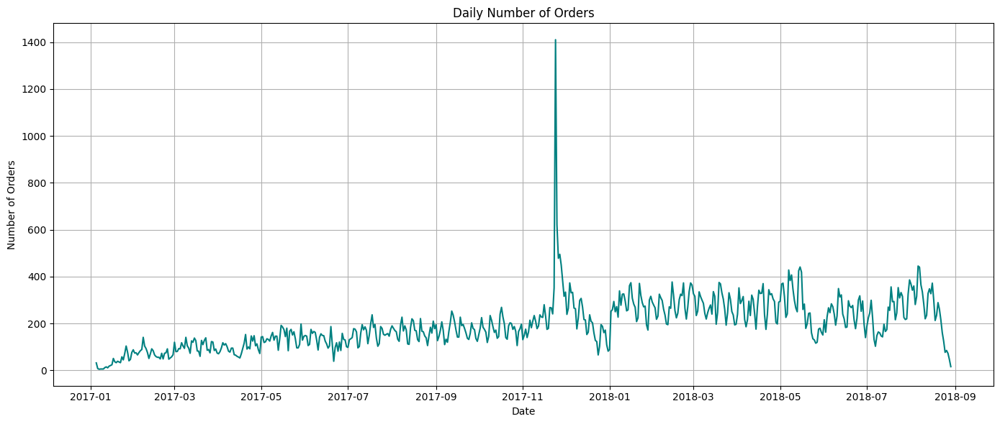

In [375]:
# Group by date (you can change to 'W' for weekly or 'M' for monthly)
order_counts = df_final['order_purchase'].dt.date.value_counts().sort_index()

# Plot
plt.figure(figsize=(14, 6))
order_counts.plot(kind='line', color='teal')
plt.title('Daily Number of Orders')
plt.xlabel('Date')
plt.ylabel('Number of Orders')
plt.grid(True)
plt.tight_layout()
plt.show()

- A significant spike in December 2017. Replicating the drivers behind this peak could inform future growth strategies.
- The uplift in daily order volume during 2018 suggests operational scalability and growing market traction.

#### Daily Revenue Trend

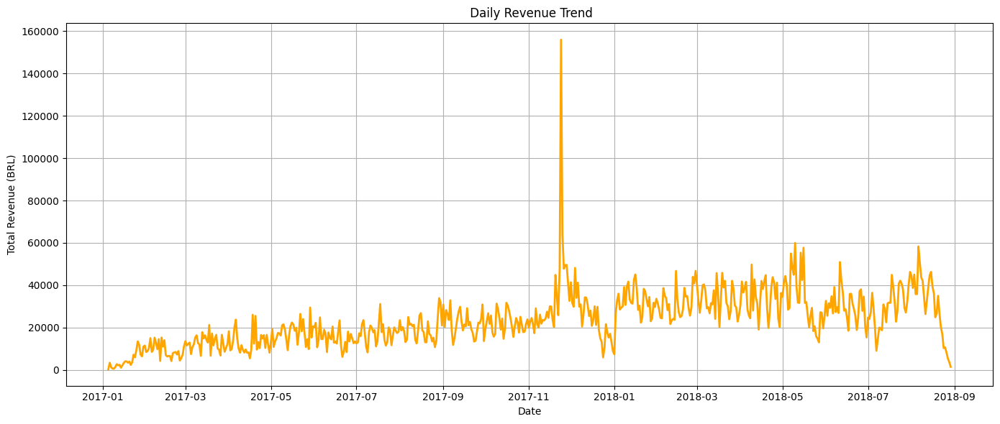

In [376]:
# Group by purchase date and sum price
daily_revenue = df_final.groupby(df_final['order_purchase'].dt.date)['price'].sum()

# Plot revenue trend
plt.figure(figsize=(14, 6))
plt.plot(daily_revenue.index, daily_revenue.values, color='orange', linewidth=2)
plt.title(' Daily Revenue Trend')
plt.xlabel('Date')
plt.ylabel('Total Revenue (BRL)')
plt.grid(True)
plt.tight_layout()
plt.show()



#### AVG Revenue Per Order

In [377]:
# Group by order_id and sum the price for each order
order_totals = df_final.groupby('order_id')['price'].sum()

# Calculate the average price across all orders
average_price_per_order = order_totals.mean()

print(f"Average price per order: {average_price_per_order:.2f} BRL")

Average price per order: 143.95 BRL


#### AVG Order Per Day

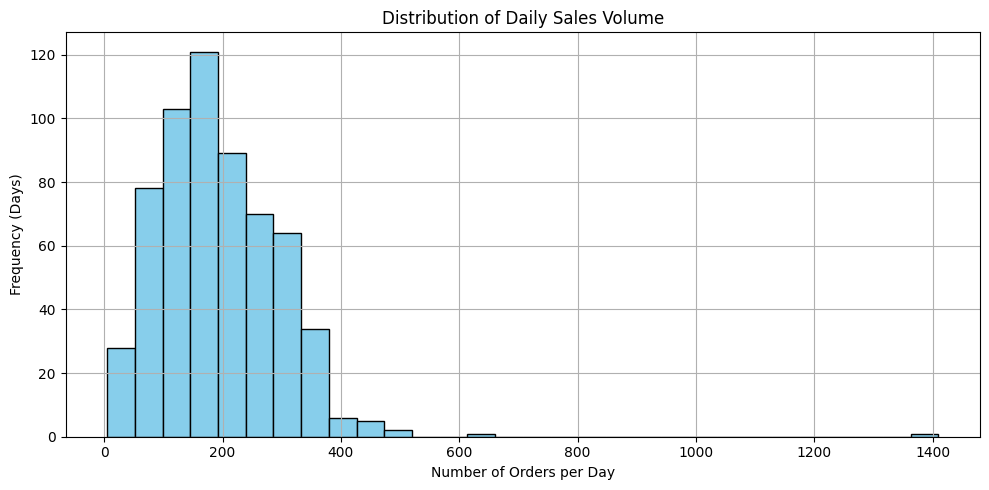

In [378]:
# Group by date and count orders
daily_sales = df_final.groupby(df_final['order_purchase'].dt.date).size()

plt.figure(figsize=(10, 5))
daily_sales.plot(kind='hist', bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Daily Sales Volume')
plt.xlabel('Number of Orders per Day')
plt.ylabel('Frequency (Days)')
plt.grid(True)
plt.tight_layout()
plt.show()


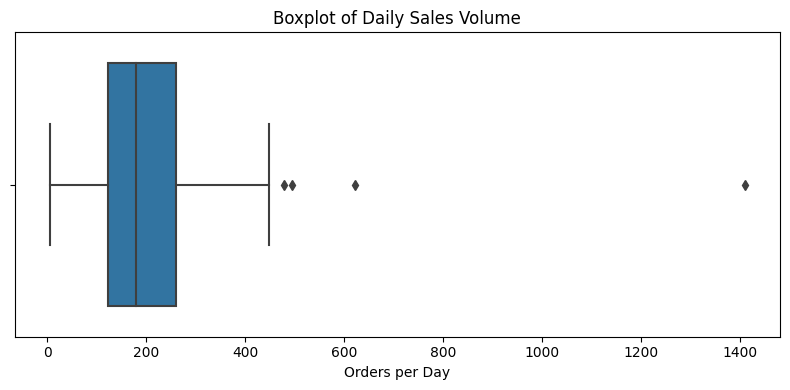

In [379]:
# Boxplot for orders per day
plt.figure(figsize=(8, 4))
sns.boxplot(x=daily_sales)
plt.title('Boxplot of Daily Sales Volume')
plt.xlabel('Orders per Day')
plt.tight_layout()
plt.show()


In [380]:
daily_sales.describe()

count     602.000000
mean      194.684385
std       107.743363
min         5.000000
25%       123.000000
50%       179.000000
75%       260.000000
max      1410.000000
dtype: float64

In [381]:
# Group by date and count orders
daily_sales = df_final.groupby(df_final['order_purchase'].dt.date).size()

# Calculate the upper quartile (75th percentile)
upper_quartile = daily_sales.quantile(0.75)

# Filter dates where sales exceed the upper quartile
high_volume_days = daily_sales[daily_sales > upper_quartile]

# Sort dates by number of orders, descending
high_volume_days_sorted = high_volume_days.sort_values(ascending=False)

#  Display results
print(f"Upper quartile threshold: {upper_quartile:.2f} orders/day")
print("\nDates with above-upper-quartile sales:\n")
print(high_volume_days_sorted.head(10))


Upper quartile threshold: 260.00 orders/day

Dates with above-upper-quartile sales:

order_purchase
2017-11-24    1410
2017-11-25     621
2017-11-27     495
2017-11-26     478
2017-11-28     449
2018-08-06     445
2018-05-15     441
2018-08-07     440
2018-05-07     428
2018-05-14     425
dtype: int64


#### Top selling cities

In [382]:
# Top selling cities 
top_contribution_cities = df_final.groupby(['customer_state', 'customer_city'])['price'].sum().sort_values(ascending=False)
top_contribution_cities = top_contribution_cities.reset_index()
top_contribution_cities.head(15)

# Rename columns
top_contribution_cities.columns = ['customer_state', 'customer_city', 'total_sales']

# Contribution percentage
total_revenue = df_final['price'].sum()
top_contribution_cities['contribution_percentage'] = (
    top_contribution_cities['total_sales'] / total_revenue * 100
)

top_contribution_cities.head(5)

,customer_state,customer_city,total_sales,contribution_percentage
0,SP,sao paulo,2003911.01,14.155698
1,RJ,rio de janeiro,1022850.06,7.225449
2,MG,belo horizonte,365476.09,2.581736
3,DF,brasilia,311230.80,2.198545
4,PR,curitiba,218114.79,1.540771


In [383]:
top_10_contribution_cities = top_contribution_cities.head(10)

top_10_contribution_cities.head(15)

,customer_state,customer_city,total_sales,contribution_percentage
0,SP,sao paulo,2003911.01,14.155698
1,RJ,rio de janeiro,1022850.06,7.225449
2,MG,belo horizonte,365476.09,2.581736
3,DF,brasilia,311230.80,2.198545
4,PR,curitiba,218114.79,1.540771
5,BA,salvador,196675.55,1.389323
6,SP,campinas,195045.01,1.377805
7,RS,porto alegre,194570.52,1.374453
8,SP,guarulhos,155136.95,1.095893
9,RJ,niteroi,132316.48,0.934688


#### Top Selling States

In [384]:
# Top Selling States
top_contribution_states = df_final.groupby('customer_state')['price'].sum().sort_values(ascending=False)
top_contribution_states = top_contribution_states.reset_index()
top_10_contribution_states = top_contribution_states.head(10)

#Rename columns
top_10_contribution_states.columns = ['customer_state', 'total_sales']

# Contribution percentage
total_revenue = df_final['price'].sum()
top_10_contribution_states['contribution_percentage'] = (
    top_10_contribution_states['total_sales'] / total_revenue * 100
)

top_10_contribution_states.head(10)

C:\Users\aungt\AppData\Local\Temp\ipykernel_33428\661501346.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_contribution_states['contribution_percentage'] = (


,customer_state,total_sales,contribution_percentage
0,SP,5432313.55,38.374055
1,RJ,1901613.43,13.433065
2,MG,1634464.92,11.545918
3,RS,783080.92,5.531711
4,PR,703721.16,4.971111
5,BA,540517.15,3.818232
6,SC,535842.39,3.785210
7,DF,312024.29,2.204151
8,GO,308769.93,2.181162
9,ES,282980.14,1.998982


#### AVG order values and Number of customers Per City

In [385]:
# Count unique orders per city
number_order_by_city = df_final.groupby('customer_city')['order_id'].nunique().sort_values(ascending=False)

# Sum total revenue per city
revenue_by_city = df_final.groupby('customer_city')['price'].sum().sort_values(ascending=False)

# Calculate Average Order Value (AOV)
average_order_value_by_city = (revenue_by_city / number_order_by_city).sort_values(ascending=False)

average_order_value_by_city.head(10)

customer_city
agrestina                  3978.00
pirpirituba                2680.00
pianco                     2200.00
nova esperanca do piria    2199.00
engenheiro navarro         1997.00
mariental                  1799.00
loreto                     1599.99
amarante                   1520.00
periquito                  1481.50
ibitita                    1450.00
dtype: float64

In [386]:
# Count number of customers per city
customer_by_city = df_final.groupby('customer_city')['customer_unique_id'].nunique().sort_values(ascending=False)
customer_by_city.head()


customer_city
sao paulo         14832
rio de janeiro     6545
belo horizonte     2643
brasilia           2050
curitiba           1450
Name: customer_unique_id, dtype: int64

C:\Users\aungt\AppData\Local\Temp\ipykernel_33428\2887196968.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top_cities, rotation=45, ha='right')


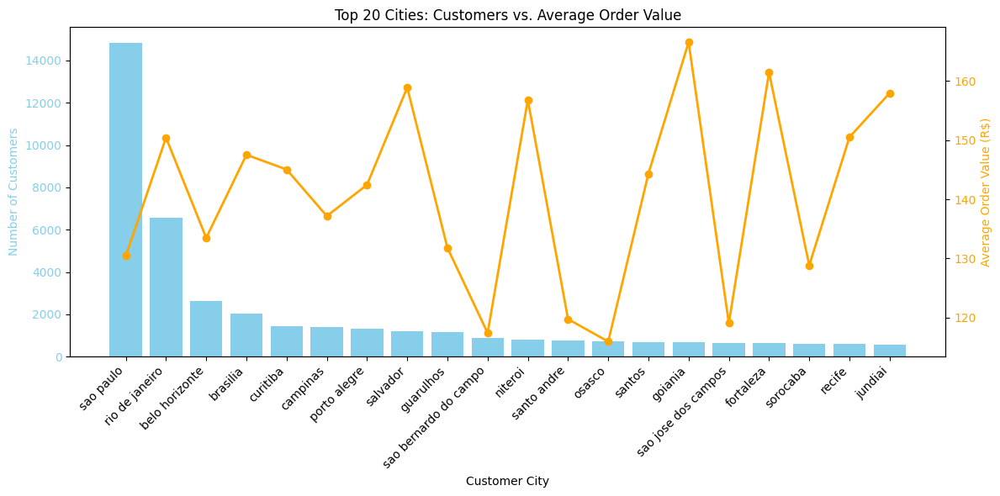

In [387]:
# Align both Series to the same top cities
top_cities = customer_by_city.head(20).index
aov_top = average_order_value_by_city[top_cities]
customer_top = customer_by_city[top_cities]

# Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar chart for number of customers
color1 = 'skyblue'
ax1.bar(top_cities, customer_top, color=color1)
ax1.set_xlabel('Customer City')
ax1.set_ylabel('Number of Customers', color=color1)
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_xticklabels(top_cities, rotation=45, ha='right')

# Twin axis for AOV
ax2 = ax1.twinx()
color2 = 'orange'
ax2.plot(top_cities, aov_top, color=color2, marker='o', linewidth=2)
ax2.set_ylabel('Average Order Value (R$)', color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

plt.title('Top 20 Cities: Customers vs. Average Order Value')
plt.tight_layout()
plt.show()

#### Seasonal Revenue Comparison: 2017 & 2018


purchase_year        2017        2018
season                               
autumn         1333576.11  3087558.80
spring         2402211.83         NaN
summer         1158377.57  1867251.20
winter         1588057.92  2719180.96


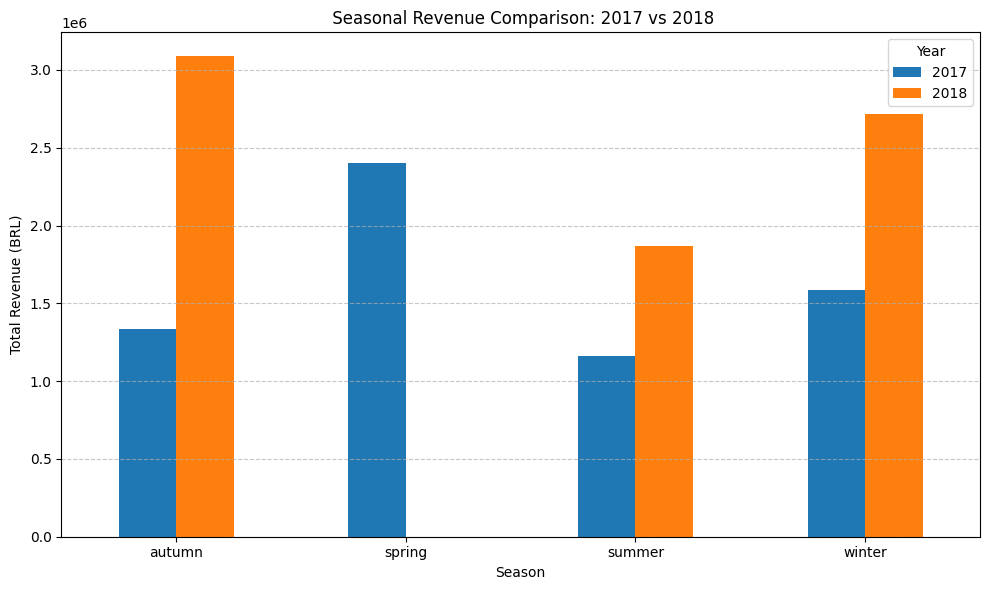

In [388]:

# Group by season and year, then sum price
season_year_revenue = df_final.groupby(['season','purchase_year'])['price'].sum().unstack()

# Display result
print(season_year_revenue)

season_year_revenue.plot(kind='bar', figsize=(10, 6), color=['#1f77b4', '#ff7f0e'])
plt.title(' Seasonal Revenue Comparison: 2017 vs 2018')
plt.xlabel('Season')
plt.ylabel('Total Revenue (BRL)')
plt.xticks(rotation=0)
plt.legend(title='Year')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### Pareto Analysis 

In [389]:
df_final.head()

,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery,customer_unique_id,customer_zip_code_prefix,...,purchase_month,purchase_day,purchase_hour,purchase_minute,total_price,season,purchase_period,day_name,day_type,price_segment
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,2,10,56,38.71,spring,morning,Monday,Weekday,Low
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,2,10,56,38.71,spring,morning,Monday,Weekday,Low
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,2,10,56,38.71,spring,morning,Monday,Weekday,Low
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:00,2017-08-15 20:05:00,2017-08-17 15:28:00,2017-08-18 14:44:00,2017-08-28,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,8,15,18,29,37.77,winter,evening,Tuesday,Weekday,Low
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:00,2017-08-02 18:43:00,2017-08-04 17:35:00,2017-08-07 18:30:00,2017-08-15,ef0996a1a279c26e7ecbd737be23d235,2290,...,8,2,18,24,37.77,winter,evening,Wednesday,Weekday,Low


In [390]:
# Group by Product ID and Sum the revenue
pareto_productid_df = df_final.groupby('product_id')['total_price'].sum().reset_index()
pareto_productcategory_df = df_final.groupby('product_category')['total_price'].sum().reset_index()

# Sort by revenue descending
pareto_productid_df = pareto_productid_df.sort_values(by='total_price', ascending=False)
pareto_productcategory_df = pareto_productcategory_df.sort_values(by='total_price', ascending=False)

# Calculate cumulative revenue and cumulative percentage
pareto_productid_df['cumulative_revenue'] = pareto_productid_df['total_price'].cumsum()
total_revenue = pareto_productid_df['total_price'].sum()
pareto_productid_df['cumulative_percentage'] = (pareto_productid_df['cumulative_revenue'] / total_revenue) * 100

# Repeat for product category
pareto_productcategory_df['cumulative_revenue'] = pareto_productcategory_df['total_price'].cumsum()
total_revenue_cat = pareto_productcategory_df['total_price'].sum()
pareto_productcategory_df['cumulative_percentage'] = (pareto_productcategory_df['cumulative_revenue'] / total_revenue_cat) * 100

# Classify as top 80% as 'Class A', Next 15% as 'Class B', Rest as 'Class C'
def classify_abc(percentage):
    if percentage <= 80:
        return 'Class A'
    elif percentage <= 95:
        return 'Class B'
    else:
        return 'Class C'
pareto_productid_df['ABC_Class'] = pareto_productid_df['cumulative_percentage'].apply(classify_abc)
pareto_productcategory_df['ABC_Class'] = pareto_productcategory_df['cumulative_percentage'].apply(classify_abc)

pareto_productcategory_df.head(16)

,product_category,total_price,cumulative_revenue,cumulative_percentage,ABC_Class
43,health_beauty,1480244.49,1480244.49,9.093458,Class A
70,watches_gifts,1354010.78,2834255.27,17.411436,Class A
7,bed_bath_table,1309520.36,4143775.63,25.456099,Class A
65,sports_leisure,1194502.78,5338278.41,32.794185,Class A
15,computers_accessories,1093497.41,6431775.82,39.511773,Class A
39,furniture_decor,938365.56,7370141.38,45.276353,Class A
49,housewares,819308.70,8189450.08,50.309541,Class A
20,cool_stuff,748513.53,8937963.61,54.907820,Class A
5,auto,710184.52,9648148.13,59.270635,Class A
42,garden_tools,622232.56,10270380.69,63.093142,Class A


In [391]:
# Create a summary table with both Count and Percentage
counts = pareto_productid_df['ABC_Class'].value_counts()
pcts = pareto_productid_df['ABC_Class'].value_counts(normalize=True) * 100

# Concatenate into one readable summary
abc_summary = pd.concat([counts, pcts], axis=1, keys=['Count', 'Percentage (%)'])
print(abc_summary)

           Count  Percentage (%)
ABC_Class                       
Class C    12038       36.719131
Class B    11659       35.563080
Class A     9087       27.717789


In [392]:
# Create a summary table with both Count and Percentage
counts = pareto_productcategory_df['ABC_Class'].value_counts()
pcts = pareto_productcategory_df['ABC_Class'].value_counts(normalize=True) * 100

# Concatenate into one readable summary
abc_summary = pd.concat([counts, pcts], axis=1, keys=['Count', 'Percentage (%)'])
print(abc_summary)

           Count  Percentage (%)
ABC_Class                       
Class C       39       54.929577
Class A       16       22.535211
Class B       16       22.535211


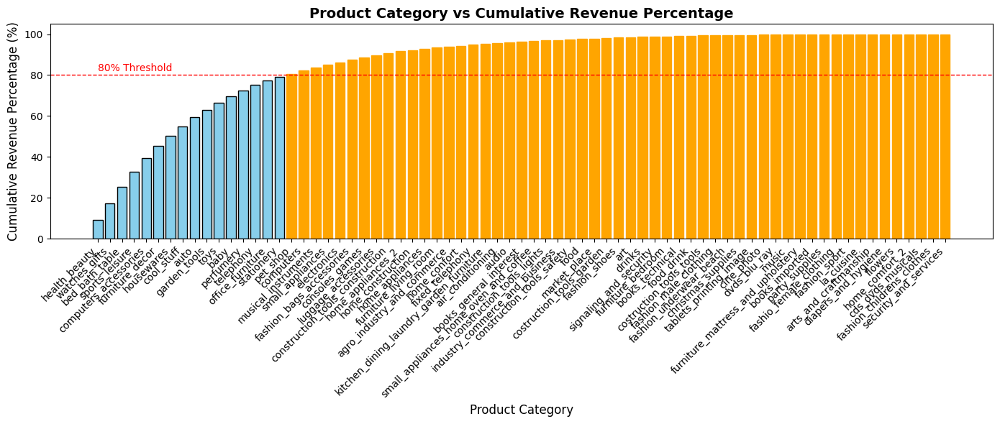

In [393]:

# Sort by cumulative percentage descending
sorted_df = pareto_productcategory_df.sort_values(by='cumulative_percentage', ascending=True).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(14, 6))

# Bar chart
bars = ax.bar(
    sorted_df['product_category'],
    sorted_df['cumulative_percentage'],
    color='skyblue',
    edgecolor='black'
)

# Titles and labels
ax.set_title('Product Category vs Cumulative Revenue Percentage', fontsize=14, fontweight='bold')
ax.set_xlabel('Product Category', fontsize=12)
ax.set_ylabel('Cumulative Revenue Percentage (%)', fontsize=12)

# Rotate labels for readability
plt.xticks(rotation=45, ha='right')

# Add 80% Pareto threshold line
ax.axhline(y=80, color='red', linestyle='--', linewidth=1)
ax.text(0, 82, '80% Threshold', color='red', fontsize=10)

# Highlight bars that contribute to the 80% cutoff
for i, value in enumerate(sorted_df['cumulative_percentage']):
    if value >= 80:
        bars[i].set_color('orange')

plt.tight_layout()
plt.show()

#### Share of Sales by Purchase Period

                 Total Revenue (BRL)  Revenue Share (%)
purchase_period                                        
afternoon                 5566260.70          39.320263
evening                   4859135.60          34.325106
morning                   3107138.36          21.948935
early morning              623679.73           4.405696


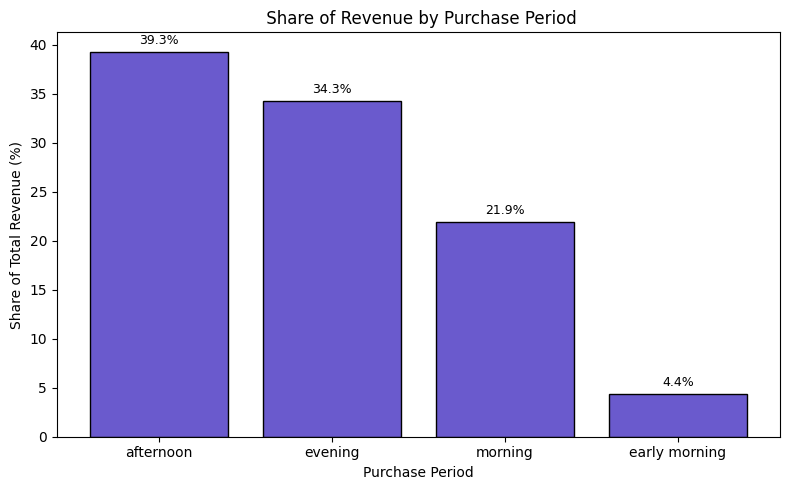

In [394]:
# Group by purchase revenue and purchase period and sum revenue
period_revenue = df_final.groupby('purchase_period')['price'].sum()

# Calculate share of total revenue
period_revenue_share = (period_revenue / period_revenue.sum()) * 100

# Display as DataFrame
purchase_period_summary = pd.DataFrame({
    'Total Revenue (BRL)': period_revenue,
    'Revenue Share (%)': period_revenue_share
}).sort_values('Revenue Share (%)', ascending = False)

print(purchase_period_summary)

# Sort values for consistent plotting
sorted_summary = purchase_period_summary.sort_values('Revenue Share (%)', ascending=False)

# Plot
plt.figure(figsize=(8, 5))
bars = plt.bar(sorted_summary.index, sorted_summary['Revenue Share (%)'], color='slateblue', edgecolor='black')

# Add data labels
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.5, f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

# Titles and labels
plt.title(' Share of Revenue by Purchase Period')
plt.xlabel('Purchase Period')
plt.ylabel('Share of Total Revenue (%)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#### Share of Revenue per DayName

In [395]:
# Count how many time each day name appears
dayname_counts = df_final['day_name'].value_counts()

# Total revenue per day name
day_total_revenue = df_final.groupby('day_name')['price'].sum()

# AVG revenue per day name
avg_dayname_sales = (day_total_revenue / dayname_counts).sort_values(ascending=False)

# Share of total revenue per day name
day_revenue_share = (day_total_revenue / day_total_revenue.sum()) * 100

# Combine into summary DataFrame
avg_dayname_summary = pd.DataFrame({
    'Total Revenue (BRL)': day_total_revenue,
    'Average Revenue per Day': avg_dayname_sales,
    'Revenue Share (%)': day_revenue_share
}).sort_values('Revenue Share (%)', ascending=False)

# Display result
print(avg_dayname_summary)


           Total Revenue (BRL)  Average Revenue per Day  Revenue Share (%)
day_name                                                                  
Monday              2314835.72               121.341706          16.352082
Tuesday             2258780.06               118.876904          15.956102
Wednesday           2213796.42               120.840416          15.638336
Thursday            2117275.45               120.780117          14.956509
Friday              2038528.40               122.045644          14.400237
Sunday              1650396.93               118.767770          11.658462
Saturday            1562601.41               123.301618          11.038272


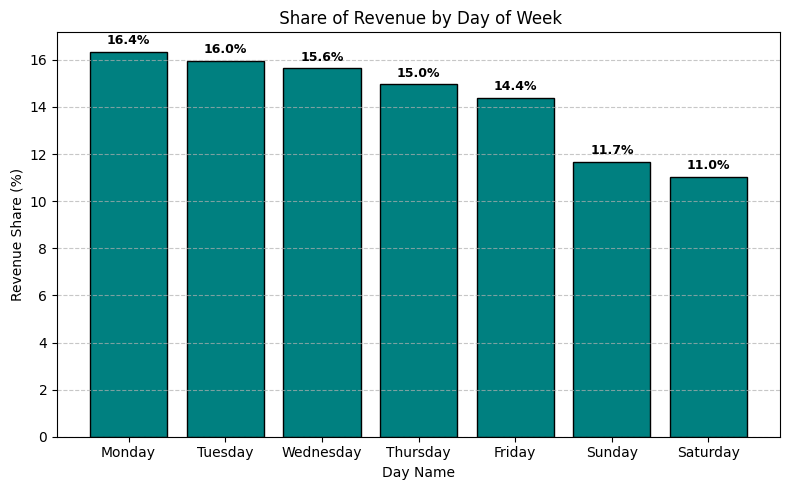

In [396]:
# Sort for consistent plotting
sorted_summary = avg_dayname_summary.sort_values('Revenue Share (%)', ascending=False)

# Plot
plt.figure(figsize=(8, 5))
bars = plt.bar(sorted_summary.index, sorted_summary['Revenue Share (%)'], color='teal', edgecolor='black')

# Add value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.2,
        f'{height:.1f}%',
        ha='center',
        va='bottom',
        fontsize=9,
        fontweight='bold'
    )

# Titles and labels
plt.title(' Share of Revenue by Day of Week')
plt.xlabel('Day Name')
plt.ylabel('Revenue Share (%)')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

- Revenue is heavily front-loaded in the weekday

#### Order Traffic Heatmap


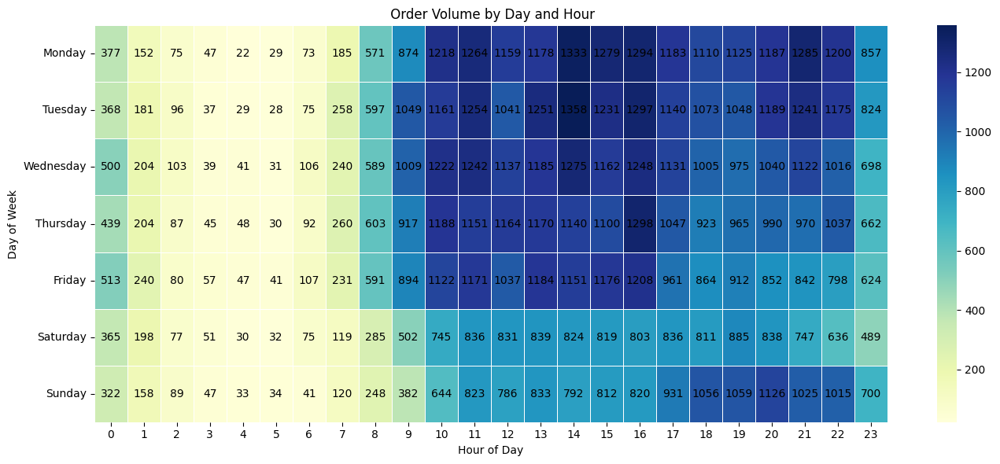

In [397]:
# Create pivot table: count of orders by Day and Hour
heatmap_data = df_final.pivot_table(index='day_name',
                                    columns='purchase_hour',
                                    values='order_id', aggfunc='count').fillna(0)

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Optional: reorder days for better readability
heatmap_data = heatmap_data.reindex(day_order)

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data,
            cmap='YlGnBu',
            linewidths=0.5,
            annot=True, # Show the number of orders in each cell
            fmt='.0f',
            annot_kws={
                'size': 10, 
                'color': 'black'})
plt.title(' Order Volume by Day and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()


#### Share of Orders by Price Segment

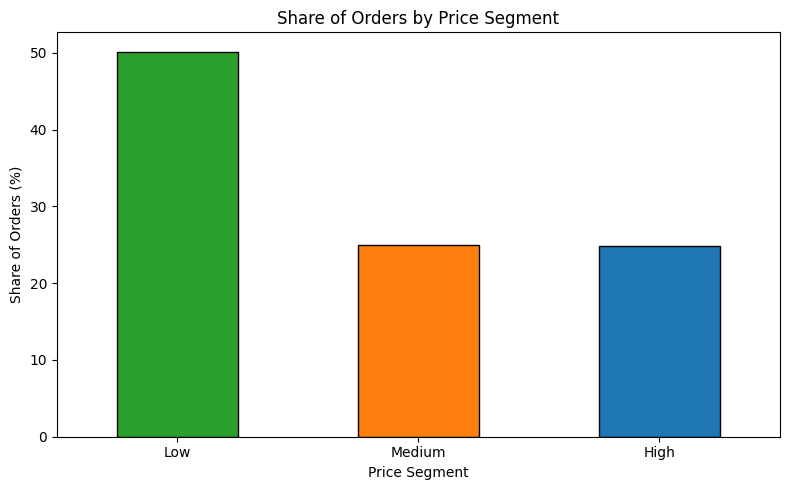

In [398]:
# Count orders per price segment
segment_counts = df_final.groupby('price_segment')['order_id'].count()

# Calculate share as percentage
segment_share = (segment_counts / segment_counts.sum()) * 100

segment_share = segment_share.round(2).sort_values(ascending=False)

segment_share.plot(kind='bar', figsize=(8, 5), color=['#2ca02c', '#ff7f0e', '#1f77b4'], edgecolor='black')
plt.title('Share of Orders by Price Segment')
plt.xlabel('Price Segment')
plt.ylabel('Share of Orders (%)')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


#### Cohort Analysis

In [399]:
df_final['purchase_month'] = df_final['order_purchase'].dt.to_period('M').dt.to_timestamp()
df_final['cohort_month'] = df_final.groupby('customer_unique_id')['purchase_month'].transform('min')

In [400]:
df_final[['purchase_month', 'cohort_month']].dtypes

purchase_month    datetime64[ns]
cohort_month      datetime64[ns]
dtype: object

In [401]:
df_final['cohort_month'] = df_final.groupby('customer_unique_id')['purchase_month'].transform('min')

# Cohort size = unique customers in month 0 (onboarding month)
cohort_sizes = (
    df_final.groupby('cohort_month')['customer_unique_id']
    .nunique()
)

# Cohort index = months since first purchase
year_diff  = df_final['purchase_month'].dt.year  - df_final['cohort_month'].dt.year
month_diff = df_final['purchase_month'].dt.month - df_final['cohort_month'].dt.month
df_final['cohort_index'] = (year_diff * 12 + month_diff).astype('Int64')

In [402]:
df_final.head()

,order_id,customer_id,order_status,order_purchase,order_approved,order_delivered_carrier,order_delivered_customer,order_estimated_delivery,customer_unique_id,customer_zip_code_prefix,...,purchase_hour,purchase_minute,total_price,season,purchase_period,day_name,day_type,price_segment,cohort_month,cohort_index
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,56,38.71,spring,morning,Monday,Weekday,Low,2017-09-01,1
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,56,38.71,spring,morning,Monday,Weekday,Low,2017-09-01,1
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,10,56,38.71,spring,morning,Monday,Weekday,Low,2017-09-01,1
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:00,2017-08-15 20:05:00,2017-08-17 15:28:00,2017-08-18 14:44:00,2017-08-28,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,18,29,37.77,winter,evening,Tuesday,Weekday,Low,2017-08-01,0
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:00,2017-08-02 18:43:00,2017-08-04 17:35:00,2017-08-07 18:30:00,2017-08-15,ef0996a1a279c26e7ecbd737be23d235,2290,...,18,24,37.77,winter,evening,Wednesday,Weekday,Low,2017-08-01,0


In [403]:
cohort_counts = df_final.pivot_table(
    index='cohort_month',         # rows = cohorts (first purchase month)
    columns='cohort_index',       # columns = months since first purchase
    values='customer_unique_id',  # what we count
    aggfunc=pd.Series.nunique,    # unique customers
    fill_value=0
)

In [404]:
print(cohort_counts)

cohort_index    0   1   2   3   4   5   6   7   8   9   10  11  12  13  14  \
cohort_month                                                                 
2017-01-01     753   3   2   1   3   1   3   1   1   0   3   1   5   3   1   
2017-02-01    1693   4   5   2   7   2   4   3   1   3   2   5   2   3   2   
2017-03-01    2595  13   9  10   9   4   4   8   9   2  10   3   6   3   4   
2017-04-01    2340  14   5   4   8   6   8   7   7   4   6   2   2   1   2   
2017-05-01    3560  17  17  14  11  12  15   5   9  10   9  12   9   1   7   
2017-06-01    3114  15  11  12   8  12  12   7   4   7  10  11   5   4   6   
2017-07-01    3844  20  14   9  11   8  12   4   7  10   8  11   5  10   0   
2017-08-01    4149  28  14  11  15  22  12  11   6   6  10   8   4   0   0   
2017-09-01    4091  28  22  12  18   9   9  10  12   8  11   3   0   0   0   
2017-10-01    4413  31  11   4  10   9  10  16  12   9   9   0   0   0   0   
2017-11-01    7218  40  28  13  14  13   8  14  10   4   0   0  

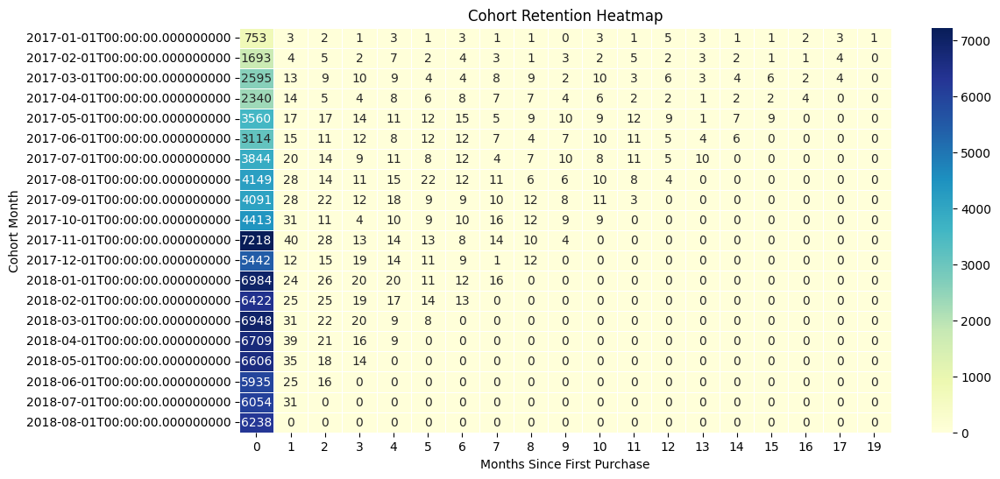

In [405]:
plt.figure(figsize=(12, 6))
sns.heatmap(
    cohort_counts,
    annot=True, fmt="d",
    cmap="YlGnBu", linewidths=0.5
)
plt.title("Cohort Retention Heatmap")
plt.ylabel("Cohort Month")
plt.xlabel("Months Since First Purchase")
plt.yticks(rotation=0)
plt.show()

In [406]:
# Revenue per cohort per lifetime month
cohort_revenue = df_final.pivot_table(
    index='cohort_month',
    columns='cohort_index',
    values='price',  
    aggfunc='sum',
    fill_value=0
)

In [407]:
print(cohort_revenue)

cohort_index          0        1        2        3        4        5   \
cohort_month                                                            
2017-01-01     128552.10   124.92    82.89    75.00   199.70    59.99   
2017-02-01     259044.40   478.38   484.50    89.25   978.22    49.99   
2017-03-01     395889.77  1493.86  1452.24  1873.01   989.33  1306.99   
2017-04-01     389731.06  2638.53   800.38   670.78  2076.98  1046.38   
2017-05-01     540960.93  1561.40  2777.79  1575.60  1088.59  1413.91   
2017-06-01     447758.41  3716.20  1673.04  1238.65  1278.79  1421.68   
2017-07-01     525039.80  4848.00  1878.25  1005.16   951.74  1653.48   
2017-08-01     589265.37  4369.76  1905.19   804.74  1539.26  2541.32   
2017-09-01     651800.29  3046.03  2845.74  1518.35  4171.39  1663.48   
2017-10-01     682181.29  3996.34  1324.51   520.67  1199.00  1184.40   
2017-11-01    1029924.98  8905.26  3852.36  1310.31  2161.32  1836.63   
2017-12-01     752029.29  2167.08  1553.58  2490.15

#### RFM Analysis

In [408]:
# Calculate Recency, Frequency, Monetary

snapshot_date = pd.to_datetime('2018-09-01')

rfm = df_final.groupby('customer_unique_id').agg({
    'order_purchase': lambda x: (snapshot_date - x.max()).days,     # Recency
    'order_id': 'count',                                            # Frequency
    'price': 'sum'                                                  # Monetary (use revenue column)
}).rename(columns={
    'order_purchase': 'Recency',
    'order_id': 'Frequency',
    'price': 'Monetary'
})

print(rfm.head())

                                  Recency  Frequency  Monetary
customer_unique_id                                            
0000366f3b9a7992bf8c76cfdf3221e2      113          1    129.90
0000b849f77a49e4a4ce2b2a4ca5be3f      116          1     18.90
0000f46a3911fa3c0805444483337064      539          1     69.00
0000f6ccb0745a6a4b88665a16c9f078      323          1     25.99
0004aac84e0df4da2b147fca70cf8255      290          1    180.00


In [409]:
# Score R, F, M (1–5 scale using quintiles)
# Recency: lower = better, so we invert the scale
rfm['R_score'] = pd.qcut(rfm['Recency'], 5, labels=[5,4,3,2,1]).astype(int)

# Frequency: higher = better
rfm['F_score'] = pd.qcut(rfm['Frequency'].rank(method='first'), 5, labels=[1,2,3,4,5]).astype(int)

# Monetary: higher = better
rfm['M_score'] = pd.qcut(rfm['Monetary'], 5, labels=[1,2,3,4,5]).astype(int)

# Combine into a single RFM score
rfm['RFM_score'] = rfm['R_score'].astype(str) + rfm['F_score'].astype(str) + rfm['M_score'].astype(str)


In [410]:
# Define granular 11-segment RFM mapping segments
def rfm_segment(row):
    R, F, M = row['R_score'], row['F_score'], row['M_score']
    
    if R >= 4 and F >= 4:
        return "Champions"
    elif F >= 4 and R >= 2:
        return "Loyal Customers"
    elif R >= 3 and F >= 2:
        return "Potential Loyalists"
    elif R == 5 and F == 1:
        return "New Customers"
    elif R == 4 and F == 1:
        return "Promising"
    elif R in [2,3] and F in [2,3]:
        return "Need Attention"
    elif R == 2 and F >= 3:
        return "At Risk"
    elif R == 2 and F == 1:
        return "About to Sleep"
    elif R == 1 and F == 1:
        return "Hibernating"
    elif R == 1 and F >= 2:
        return "Lost"
    else:
        return "Others"

rfm['Segment'] = rfm.apply(rfm_segment, axis=1)

In [411]:
# Segement summary
segment_summary = rfm.groupby('Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'Segment': 'count'
}).rename(columns={'Segment': 'CustomerCount'}).sort_values('CustomerCount', ascending=False)

print(segment_summary)

                        Recency  Frequency    Monetary  CustomerCount
Segment                                                              
Potential Loyalists  135.954356   1.000000  129.747479          23026
Champions             92.459621   1.582300  176.619436          15243
Loyal Customers      270.189515   1.577095  171.307024          15202
Lost                 472.148094   1.294005  155.761328          15112
Need Attention       318.531387   1.000000  134.750772           7503
Hibernating          471.810185   1.000000  132.522078           3888
Promising            138.163027   1.000000  135.315133           3846
Others               221.802725   1.000000  129.341132           3817
New Customers         46.939186   1.000000  131.202893           3782
About to Sleep       317.620222   1.000000  130.592838           3689


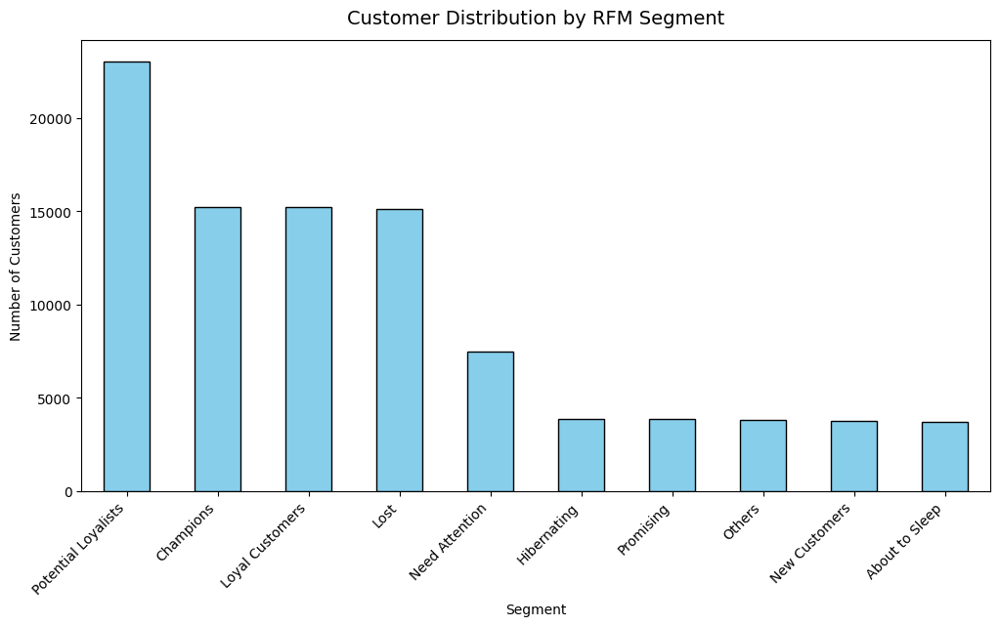

In [412]:
# Customer Distibution by RFM segment
segment_data = segment_summary['CustomerCount'].sort_values(ascending=False)

plt.figure(figsize=(12,6))
segment_data.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Customer Distribution by RFM Segment", fontsize=14, pad=12)
plt.xlabel("Segment")
plt.ylabel("Number of Customers")
plt.xticks(rotation=45, ha='right')
plt.show()

In [413]:
# Reset index so customer ID is a column
rfm = rfm.reset_index()

# Merge segment info into your original df_final
df_final = df_final.merge(rfm[['customer_unique_id', 'Segment']], 
                          on='customer_unique_id', how='left')

## Customer Analysis

#### Unique number of customers

In [414]:
df_final['customer_unique_id'].nunique()

95108

#### Distribution of Daily Unique Customer per day

In [415]:
# Create order_date column
df_final['order_date'] = df_final['order_purchase'].dt.date

# Count unique customers per day
daily_customers = (
    df_final.groupby('order_date')['customer_unique_id']
    .nunique()
    .reset_index(name='unique_customers')
)

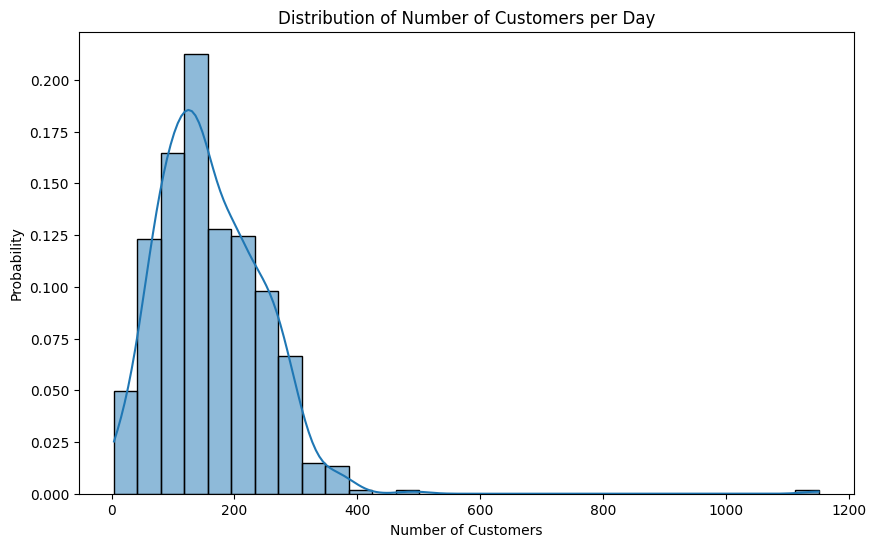

In [416]:
plt.figure(figsize=(10,6))
sns.histplot(daily_customers['unique_customers'], kde=True, bins=30, stat="probability")
plt.title("Distribution of Number of Customers per Day")
plt.xlabel("Number of Customers")
plt.ylabel("Probability")
plt.show()

- Daily customer traffic is right-skewed (long tail to the right).
- The majority of days had 100–250 customers, but a few exceptional days saw spikes


## Delivery Analysis

In [417]:
df_final.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase',
       'order_approved', 'order_delivered_carrier', 'order_delivered_customer',
       'order_estimated_delivery', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state',
       'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date',
       'price', 'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'product_category', 'from_purchase_to_approved',
       'from_purchase_to_approved_minutes', 'from_purchase_to_carrier',
       'from_purchase_to_carrier_hours', 'from_purchase_to_customer',
       'from_purchase_to_customer_days', 'estimated_order_delivery',
       'estimated_order_delivery_days', 'delivery_gap', 'delivery_status',
       'carrier_del

#### AVG Delivery Cost per order

In [418]:
total_number_of_freight_values = df_final['freight_value'].sum()

total_unique_orders = df_final['order_id'].nunique()

average_freight_per_order = total_number_of_freight_values / total_unique_orders

print(f"Average freight cost per order: R$ {average_freight_per_order:.2f}")

Average freight cost per order: R$ 23.89


#### AVG Delivery Cost Per Order by Customer City

In [457]:
# 1. Group by city and perform multiple aggregations
city_metrics = df_final.groupby('customer_city').agg({
    'freight_value': 'mean',
    'order_id': 'nunique'
})

# 2. Rename columns for clarity
city_metrics = city_metrics.rename(columns={
    'freight_value': 'avg_delivery_cost',
    'order_id': 'order_count'
})

# 3. Sort by order count to see your biggest markets first
city_metrics = city_metrics.sort_values(by='order_count', ascending=False)

# 4. Reset index to make 'customer_city' a column
city_metrics = city_metrics.reset_index()

city_metrics.head(10)

,customer_city,avg_delivery_cost,order_count
0,sao paulo,14.380280,15364
1,rio de janeiro,20.810253,6801
2,belo horizonte,19.567772,2738
3,brasilia,21.104226,2110
4,curitiba,18.877635,1504
5,campinas,14.997459,1422
6,porto alegre,20.769787,1366
7,salvador,25.456699,1238
8,guarulhos,14.723764,1177
9,sao bernardo do campo,13.594301,925


In [419]:
avg_delivery_cost_per_city = df_final.groupby('customer_city')['freight_value'].mean().sort_values(ascending=False)
avg_delivery_cost_per_city.head(10)

number_order_by_city = df_final.groupby('customer_city')['order_id'].nunique().sort_values(ascending=False)
number_order_by_city.head(10)

customer_city
sao paulo                15364
rio de janeiro            6801
belo horizonte            2738
brasilia                  2110
curitiba                  1504
campinas                  1422
porto alegre              1366
salvador                  1238
guarulhos                 1177
sao bernardo do campo      925
Name: order_id, dtype: int64

In [420]:
avg_delivery_cost_per_city.head()

customer_city
itupiranga       203.38
amarante         193.84
almino afonso    170.11
canapi           147.32
marilac          142.49
Name: freight_value, dtype: float64

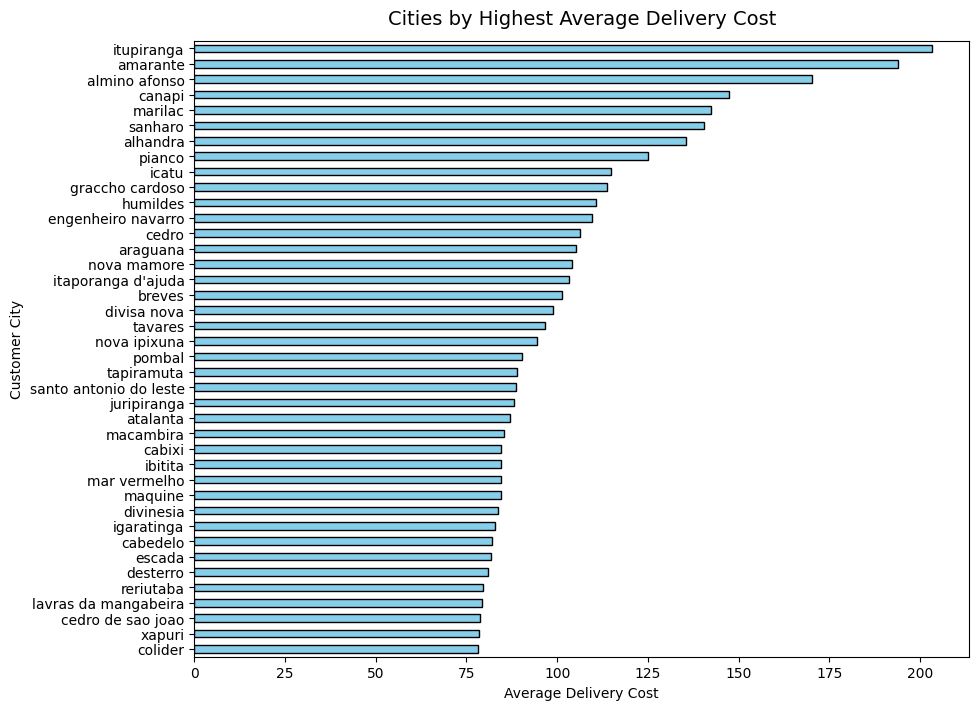

In [459]:
plt.figure(figsize=(10,8))
avg_delivery_cost_per_city.head(40).plot(
    kind='barh', color='skyblue', edgecolor='black'
)

plt.title("Cities by Highest Average Delivery Cost", fontsize=14, pad=12)
plt.xlabel("Average Delivery Cost")
plt.ylabel("Customer City")
plt.gca().invert_yaxis()  # so the highest value is at the top
plt.show()

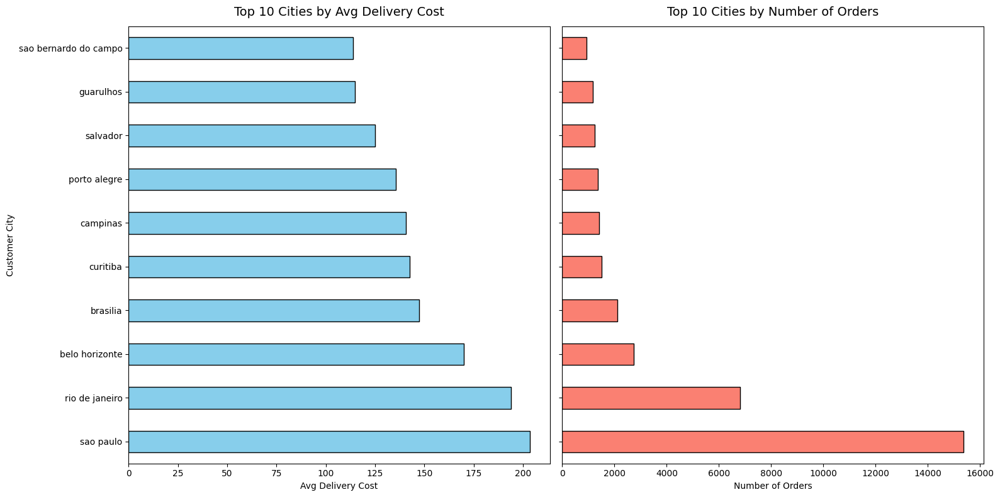

In [422]:
fig, axes = plt.subplots(1, 2, figsize=(16,8), sharey=True)  # side by side, same y-axis (cities)

# --- Plot 1: Avg Delivery Cost ---
avg_delivery_cost_per_city.head(10).plot(
    kind='barh', ax=axes[0], color='skyblue', edgecolor='black'
)
axes[0].set_title("Top 10 Cities by Avg Delivery Cost", fontsize=14, pad=12)
axes[0].set_xlabel("Avg Delivery Cost")
axes[0].set_ylabel("Customer City")

# --- Plot 2: Number of Orders ---
number_order_by_city.head(10).plot(
    kind='barh', ax=axes[1], color='salmon', edgecolor='black'
)
axes[1].set_title("Top 10 Cities by Number of Orders", fontsize=14, pad=12)
axes[1].set_xlabel("Number of Orders")
axes[1].set_ylabel("Customer City")

plt.tight_layout()
plt.show()


#### On-Time Delivery Rate

In [423]:
delivery_status_counts = df_final['delivery_status'].value_counts(normalize=True) * 100
print(delivery_status_counts)

delivery_status
early    92.202218
late      7.797782
Name: proportion, dtype: float64


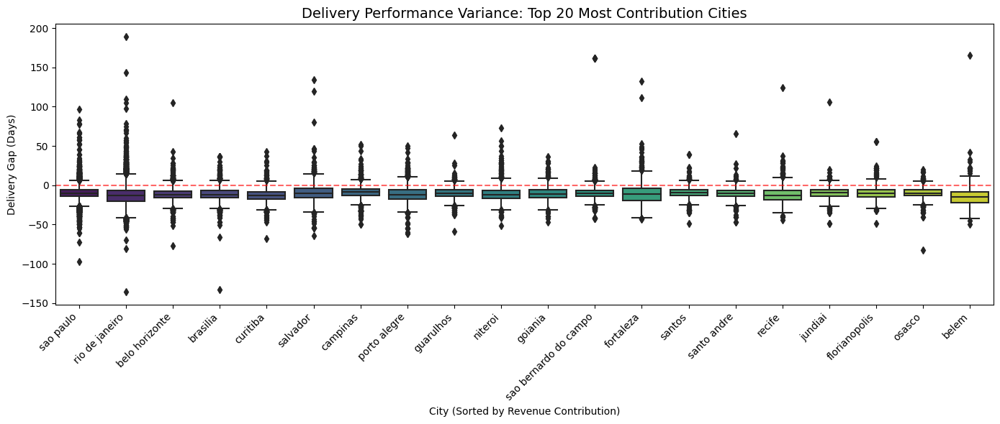

In [454]:
# FIX: Select the column 'customer_city' instead of the index
top_20_order_cities = top_contribution_cities.head(20)['customer_city'].tolist()

# Filter df_final for top 20 cities
df_top_20_order_cities = df_final[df_final['customer_city'].isin(top_20_order_cities)]

# 3. Plot the boxplot using the filtered data
plt.figure(figsize=(14,6))
sns.boxplot(
    data=df_top_20_order_cities, 
    x='customer_city', 
    y='delivery_gap', 
    palette='viridis',
    order=top_20_order_cities  # This ensures the X-axis follows your sorted list
)

# 4. Formatting
plt.xticks(rotation=45, ha='right') 
plt.title('Delivery Performance Variance: Top 20 Most Contribution Cities', fontsize=14)
plt.xlabel('City (Sorted by Revenue Contribution)')
plt.ylabel('Delivery Gap (Days)')

# Adding a horizontal line at 0 helps show which cities are "Early" vs "Late"
plt.axhline(0, color='red', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

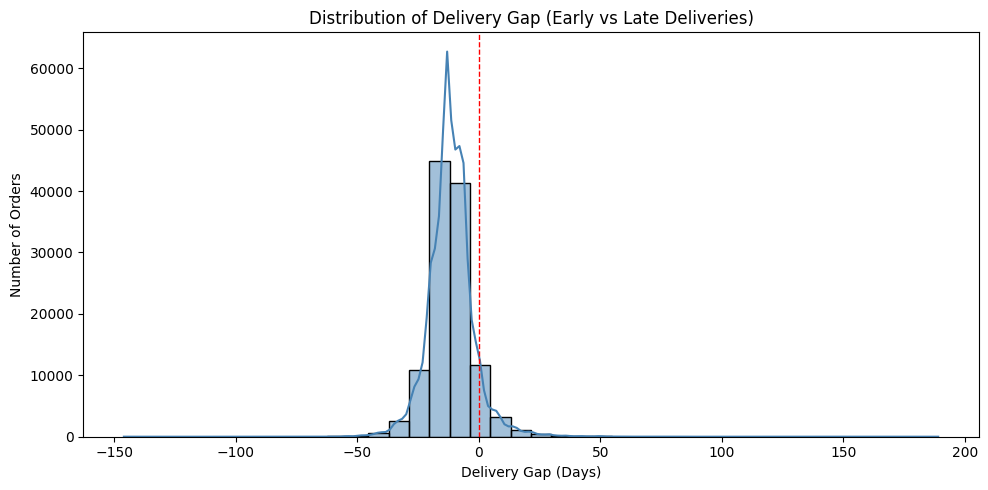

In [ ]:
# Distribution of Delivery Gap
plt.figure(figsize=(10,5))
sns.histplot(df_final['delivery_gap'], kde=True, bins=40, color='steelblue')
plt.axvline(0, color='red', linestyle='--', linewidth=1)
plt.title('Distribution of Delivery Gap (Early vs Late Deliveries)')
plt.xlabel('Delivery Gap (Days)')
plt.ylabel('Number of Orders')
plt.tight_layout()
plt.show()


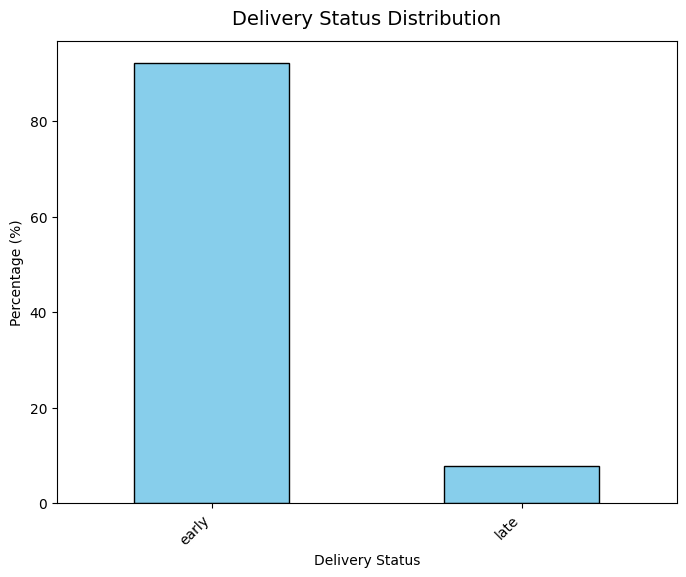

In [424]:
plt.figure(figsize=(8,6))
delivery_status_counts.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title("Delivery Status Distribution", fontsize=14, pad=12)
plt.xlabel("Delivery Status")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=45, ha='right')
plt.show()

#### Logistics Efficiency: SLA Success Rate Across Top 15 Cities

In [466]:
# 1. Create a cross-tabulation of cities vs status
# normalize='index' ensures each row (city) adds up to 100%
city_status_pct = pd.crosstab(
    df_final['customer_city'], 
    df_final['delivery_status'], 
    normalize='index'
) * 100

# 2. Filter for the top 15 cities by volume so the data is meaningful
top_volume_cities = df_final['customer_city'].value_counts().head(15).index
final_comparison = city_status_pct.loc[top_volume_cities]

# 3. Sort by 'late' to see the worst performing cities at the top
print(final_comparison.sort_values('late', ascending=False))

delivery_status            early       late
customer_city                              
salvador               83.038638  16.961362
niteroi                88.263359  11.736641
rio de janeiro         88.887526  11.112474
porto alegre           88.888889  11.111111
goiania                89.559165  10.440835
campinas               90.371230   9.628770
santos                 91.656734   8.343266
brasilia               92.813393   7.186607
sao paulo              93.777634   6.222366
guarulhos              93.857143   6.142857
sao bernardo do campo  93.868350   6.131650
belo horizonte         93.904703   6.095297
curitiba               95.269894   4.730106
osasco                 95.296753   4.703247
santo andre            95.938529   4.061471


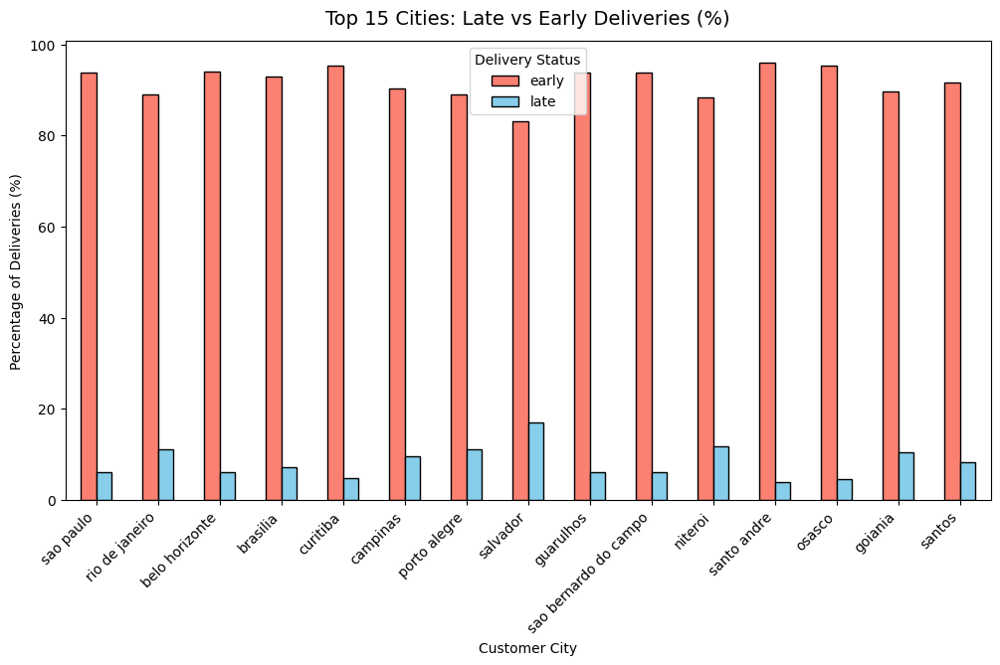

In [467]:
final_comparison.plot(
    kind='bar', figsize=(12,6), 
    color=['salmon','skyblue'], edgecolor='black'
)

plt.title("Top 15 Cities: Late vs Early Deliveries (%)", fontsize=14, pad=12)
plt.xlabel("Customer City")
plt.ylabel("Percentage of Deliveries (%)")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Delivery Status")

plt.show()

In [428]:
canceled_orders = df_final[df_final['order_status'] == 'canceled']

canceled_orders['delivery_status'].value_counts()

delivery_status
early    514
late      37
Name: count, dtype: int64

### Fulfilment Effeciency Metrics

#### AVG time from purchase to approval minutes

In [429]:
total_mins_of_all_orders = df_final['from_purchase_to_approved_minutes'].sum()

total_unique_orders = df_final['order_id'].nunique()

avg_mins_per_order = total_mins_of_all_orders / total_unique_orders

print(avg_mins_per_order)

747.0203174732303


In [430]:
df_final['from_purchase_to_approved_minutes'].describe()

count    117200.000000
mean        626.802312
std        1312.311045
min           0.000000
25%          13.000000
50%          21.000000
75%         893.000000
max       87052.000000
Name: from_purchase_to_approved_minutes, dtype: float64

#### Top 10 Slowest Sellers with AVG time from purchase to approved

In [474]:
#  Sellers by average approval time
seller_approval_time = (
    df_final.groupby('seller_id')['from_purchase_to_approved_minutes']
    .mean()
    .sort_values(ascending=True)
)

# merge with df_sellers to get seller city and state
seller_approval_time = pd.merge(
    seller_approval_time.reset_index(),
    df_sellers[['seller_id', 'seller_city', 'seller_state']],
    on='seller_id',
    how='left'
).set_index('seller_id')

# add how many orders each seller has approved
seller_order_counts = (
    df_final.groupby('seller_id')['order_id']
    .nunique()
    .reset_index(name='order_count')
)

# merge with seller_approval_time
seller_approval_time = pd.merge(
    seller_approval_time.reset_index(),
    seller_order_counts,
    on='seller_id',
    how='left'
).set_index('seller_id')

# add a column of % contribution of price by each seller
selling_amount_by_seller = (
    df_final.groupby('seller_id')['price']
    .sum()
    .reset_index(name='total_selling_amount')
)


# Calculate the grand total of selling amounts
grand_total = selling_amount_by_seller['total_selling_amount'].sum()

# Divide each seller's total by the grand total and multiply by 100 to get percentage
selling_amount_by_seller['pct_contribution'] = (
    selling_amount_by_seller['total_selling_amount'] / grand_total
) * 100


# Merge with seller_approval_time
seller_approval_time = pd.merge(
    seller_approval_time.reset_index(),
    selling_amount_by_seller[['seller_id', 'pct_contribution']],
    on='seller_id',
    how='left'
).set_index('seller_id')



seller_approval_time.head(5)

,from_purchase_to_approved_minutes,seller_city,seller_state,order_count,pct_contribution
seller_id,,,,,
720e6cf846ea7572cbb66b743fb91e6c,0.0,mogi das cruzes / sp,SP,1,0.000381
2d8cfba3fcd3170555941605edaa196a,0.0,osasco,SP,1,0.000636
2cb4700db635baa1c0d4f90ed27b6669,0.0,curitiba,PR,2,0.002117
baf15155e37ef5492731459bdc05be8a,0.0,sao paulo,SP,1,0.000332
5d043cd5512d4bd2f88e5ccdd5736c38,0.0,sao paulo,SP,1,0.004592


In [475]:
# seller approval time with top 10 most orders
top_sellers = seller_approval_time.sort_values('order_count', ascending=False)

top_sellers.head(10)


,from_purchase_to_approved_minutes,seller_city,seller_state,order_count,pct_contribution
seller_id,,,,,
6560211a19b47992c3666cc44a7e94c0,583.183789,sao paulo,SP,1854,0.907657
4a3ca9315b744ce9f8e9374361493884,597.403188,ibitinga,SP,1806,1.506756
cc419e0650a3c5ba77189a1882b7556a,678.824580,santo andre,SP,1706,0.766022
1f50f920176fa81dab994f9023523100,783.118526,sao jose do rio preto,SP,1404,0.787187
da8622b14eb17ae2831f4ac5b9dab84a,662.908481,piracicaba,SP,1314,1.195925
955fee9216a65b617aa5c0531780ce60,784.043848,sao paulo,SP,1287,0.970139
7a67c85e85bb2ce8582c35f2203ad736,606.944220,sao paulo,SP,1157,1.057485
ea8482cd71df3c1969d7b9473ff13abc,715.687651,sao paulo,SP,1146,0.270043
4869f7a5dfa277a7dca6462dcf3b52b2,578.508432,guariba,SP,1132,1.680303


#### Fulfilment Cycle Time by the Top 10 Most Contribution City

In [434]:
# Total time from oder purchase to customer delivery
total_days = df_final['from_purchase_to_customer_days'].sum()
total_orders = df_final['order_id'].nunique()
avg_days_per_order = total_days / total_orders
print(f"Average days from purchase to customer delivery: {avg_days_per_order:.2f} days")

Average days from purchase to customer delivery: 14.79 days


In [435]:
# Total time from order purchase to customer delivery by city
city_delivery_time = (
    df_final.groupby('customer_city')['from_purchase_to_customer_days']
    .mean()
    .sort_values(ascending=False)
)

# Merge with top_10_contribution_cities to focus on major cities
city_delivery_time = pd.merge(
    top_10_contribution_cities,
    city_delivery_time.reset_index(),
    on='customer_city',
    how='left'
).set_index('customer_city')

city_delivery_time.head(10)

,customer_state,total_sales,contribution_percentage,from_purchase_to_customer_days
customer_city,,,,
sao paulo,SP,2003911.01,14.155698,8.039054
rio de janeiro,RJ,1022850.06,7.225449,14.566980
belo horizonte,MG,365476.09,2.581736,11.026547
brasilia,DF,311230.80,2.198545,12.861731
curitiba,PR,218114.79,1.540771,10.386689
salvador,BA,196675.55,1.389323,18.884086
campinas,SP,195045.01,1.377805,9.741502
porto alegre,RS,194570.52,1.374453,15.738427
guarulhos,SP,155136.95,1.095893,8.264014


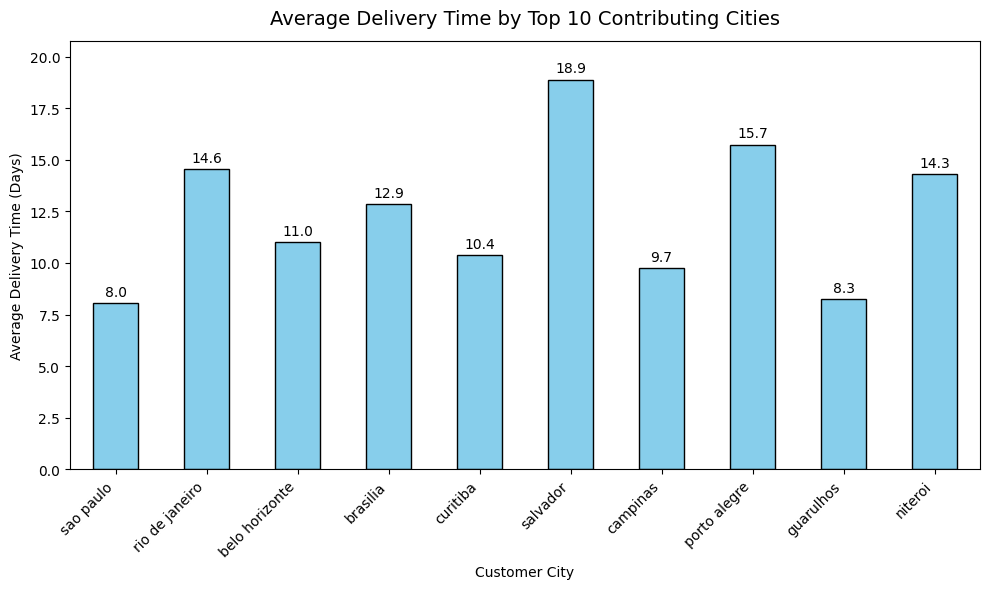

In [436]:
# Visualize city delivery times
plt.figure(figsize=(10,6))
ax = city_delivery_time['from_purchase_to_customer_days'].plot(
    kind='bar', color='skyblue', edgecolor='black'
)

# Add the data lables using the containers
ax.bar_label(ax.containers[0], fmt='%.1f', padding=3)

plt.title("Average Delivery Time by Top 10 Contributing Cities", fontsize=14, pad=12)
plt.xlabel("Customer City")
plt.ylabel("Average Delivery Time (Days)")
plt.xticks(rotation=45, ha='right')

# Add extra space at the top so labels don't get cut off
plt.ylim(0, city_delivery_time['from_purchase_to_customer_days'].max() * 1.1)

plt.tight_layout()
plt.show()

#### Delivery Summary Chart

In [491]:
city_delivery_time.head(10)
final_comparison.head(10)

# Merge to get a summary chart
Delivery_summary = pd.merge(
    city_delivery_time.reset_index(),
    final_comparison.reset_index(),
    on='customer_city',
    how='left'
)   .set_index('customer_city')

# merge again with city metrics to get avg delivery cost and order count
Delivery_summary = pd.merge(
    Delivery_summary,
    city_metrics[['customer_city', 'avg_delivery_cost', 'order_count']],
    on='customer_city',
    how='left'
)

In [493]:
Delivery_summary.head(10)

,customer_city,customer_state,total_sales,contribution_percentage,from_purchase_to_customer_days,early,late,avg_delivery_cost,order_count
0,sao paulo,SP,2003911.01,14.155698,8.039054,93.777634,6.222366,14.380280,15364
1,rio de janeiro,RJ,1022850.06,7.225449,14.566980,88.887526,11.112474,20.810253,6801
2,belo horizonte,MG,365476.09,2.581736,11.026547,93.904703,6.095297,19.567772,2738
3,brasilia,DF,311230.80,2.198545,12.861731,92.813393,7.186607,21.104226,2110
4,curitiba,PR,218114.79,1.540771,10.386689,95.269894,4.730106,18.877635,1504
5,salvador,BA,196675.55,1.389323,18.884086,83.038638,16.961362,25.456699,1238
6,campinas,SP,195045.01,1.377805,9.741502,90.371230,9.628770,14.997459,1422
7,porto alegre,RS,194570.52,1.374453,15.738427,88.888889,11.111111,20.769787,1366
8,guarulhos,SP,155136.95,1.095893,8.264014,93.857143,6.142857,14.723764,1177
9,niteroi,RJ,132316.48,0.934688,14.313903,88.263359,11.736641,20.938063,844
